# **1. Предварительный анализ и обработка таблиц**

Используемая для написания программного кода версия Python:

In [2]:
from platform import python_version
print(python_version())

3.10.9


Для предварительной обработки данных загрузим библиотеки:

In [3]:
import numpy as np #массивы
import pandas as pd #таблицы
from pandas import read_excel, DataFrame
from PIL import Image #картинки

In [4]:
df_bp = pd.read_excel('./data/X_bp.xlsx', index_col=0) #загружаем данные из одной таблицы X_bp.xlsx и присваиваем переменную df_bp
df_bp.shape #размерность df_bp

(1023, 10)

df_bp.xlsx содержит 1023 строки, индекс и 10 признаков

In [5]:
df_bp.head() #показываем первые пять строк

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [6]:
df_nup = pd.read_excel('./data/X_nup.xlsx', index_col=0) #загружаем данные из другой таблицы X_nup.xlsx и присваиваем переменную df_nup
df_nup.shape #смотрим размер

(1040, 3)

X_nup.xlsx содержит 1040 строк, индекс и 3 признака

In [7]:
df_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0
3,0,5.0,47.0
4,0,5.0,57.0


Рассмотрим их признаки:

In [8]:
pd.DataFrame(df_bp.columns, columns=['df_bp признаки'])

,df_bp признаки
0,Соотношение матрица-наполнитель
1,"Плотность, кг/м3"
2,"модуль упругости, ГПа"
3,"Количество отвердителя, м.%"
4,"Содержание эпоксидных групп,%_2"
5,"Температура вспышки, С_2"
6,"Поверхностная плотность, г/м2"
7,"Модуль упругости при растяжении, ГПа"
8,"Прочность при растяжении, МПа"
9,"Потребление смолы, г/м2"


In [9]:
pd.DataFrame(df_nup.columns, columns=['df_nup признаки'])

,df_nup признаки
0,"Угол нашивки, град"
1,Шаг нашивки
2,Плотность нашивки


В условии сказано, что нужно сделать объединение этих двух таблиц по индексу, используя тип объединения INNER.
Таблицы имеют разное количество строк, поэтому, перед тем как объединять их, предлагаю взглянуть на оба датасета в Excel и визуально оценить их.

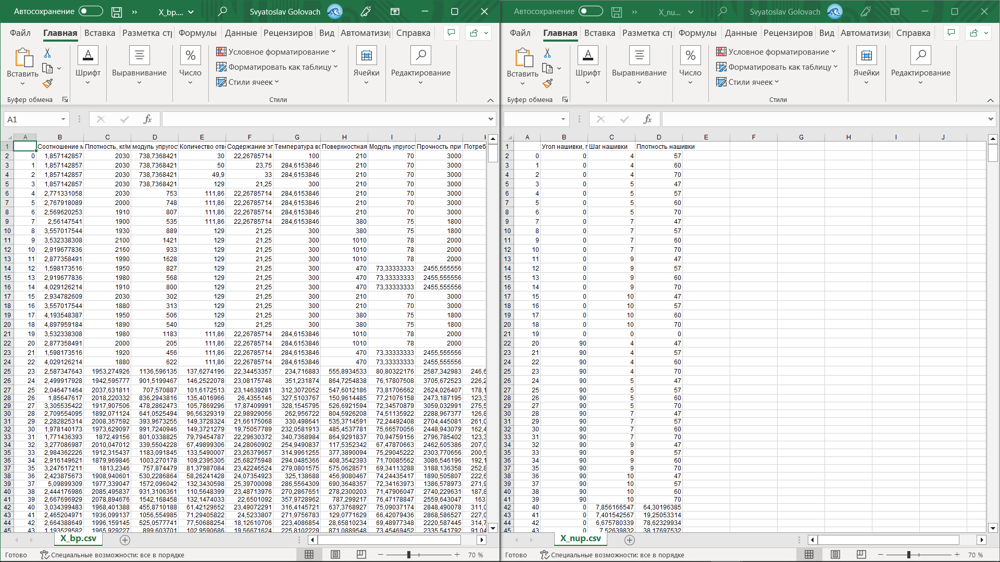

In [10]:
img = Image.open('./data/Sherlok.png')
img
#img.show() #если необходимо открыть локально

Исходя из наших наблюдений, можно заметить, что первые строки обеих датасетов были будто бы искуственно созданы, так как в них есть целые и повторяющиеся значения. Хорошо, нам уже известно что X_bp.xlsx имеет 1023 строки, а X_nup.xlsx имеет 1040 строк, и мы можем наблюдать что ровно 23 строки в первом файле и ровно 40 во втором нас смущают своими значениями. Если мы удалим эти значения, то оба датасета бутут иметь одинаковое количество строк, но соединить по индексам методом inner, без потерь, уже не получится, так как один датасет начнётся с 24 строки, а другой с 41. Поэтому нам придётся пожертвовать ещё 17 строками в X_bp.xlsx, с начала таблицы, и тогда обе таблицы начнутся с 41 строчки. Но вместе с этим, концы таблиц тоже будут несостыковываться по индексам, тогда подравняем по меньшему индексу. То есть урежем датасет до длины меньшего. Таким образом мы самостоятельно выбрали что нам нужно оставить, а что удалить. В то время как метод inner, по своему, автоматически отсекает лишние строки.

In [11]:
df_bp = df_bp.iloc[40:, :] #присваиваем переменной X_bp всё, кроме первых 40 строк
df_bp.shape #получаем 983 строки

(983, 10)

In [12]:
df_nup = df_nup.iloc[40:1023, :] #присваиваем переменной X_nup всё, кроме первых от 41 до 1022 строки
df_nup.shape #получаем так же 983 строки

(983, 3)

Теперь, когда у наших датасетов одинаковое количество строк, можно спокойно объединять их.

In [13]:
df = df_bp.join(df_nup, how='inner') #объединяем
df.shape

(983, 13)

In [14]:
df.info() #смотрим типы наших признаков

<class 'pandas.core.frame.DataFrame'>
Int64Index: 983 entries, 40 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       983 non-null    float64
 1   Плотность, кг/м3                      983 non-null    float64
 2   модуль упругости, ГПа                 983 non-null    float64
 3   Количество отвердителя, м.%           983 non-null    float64
 4   Содержание эпоксидных групп,%_2       983 non-null    float64
 5   Температура вспышки, С_2              983 non-null    float64
 6   Поверхностная плотность, г/м2         983 non-null    float64
 7   Модуль упругости при растяжении, ГПа  983 non-null    float64
 8   Прочность при растяжении, МПа         983 non-null    float64
 9   Потребление смолы, г/м2               983 non-null    float64
 10  Угол нашивки, град                    983 non-null    int64  
 11  Шаг нашивки      

Только "Угол нашивки, град" имеет тип int64(целочисленные значения), все остальные признаки float64(числа с плавающей точкой).

Датасет не нуждается в преобразовании типов значений

In [15]:
df.isna().sum() #проверяем на пропуски

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

пропуски отсутствуют

In [16]:
df.nunique() #выводим количество уникальных значений в каждом столбце

Соотношение матрица-наполнитель         983
Плотность, кг/м3                        983
модуль упругости, ГПа                   983
Количество отвердителя, м.%             983
Содержание эпоксидных групп,%_2         983
Температура вспышки, С_2                983
Поверхностная плотность, г/м2           983
Модуль упругости при растяжении, ГПа    983
Прочность при растяжении, МПа           983
Потребление смолы, г/м2                 983
Угол нашивки, град                        2
Шаг нашивки                             983
Плотность нашивки                       983
dtype: int64

данные с обозначением угла нашивки представлены всего двумя уникальными значениями - 0 и 90 градусов

In [17]:
#cохраним итоговый датасет в папку с данными
df.to_excel('./data/df.xlsx')

# **2. Разведочный анализ данных и удаление выбросов**

Для проведения разведочного анализа данных потребуются опеределенные методы обработки из нескольких библиотек. Загрузим их.

In [18]:
import matplotlib.pyplot as plt #визуализация
import seaborn as sns
from pandas import Series
from numpy.random import seed
from scipy import stats
from sklearn.preprocessing import MinMaxScaler #нормализация (масштабирование)
import warnings
warnings.filterwarnings('ignore')

In [19]:
df = pd.read_excel('./data/df.xlsx', index_col=0) #загрузим объединенный датасет
df.head() #смотрим на первые пять строк таблицы

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
40,3.034399,1968.401388,455.871019,61.421297,23.490723,316.414572,637.376893,75.090372,2848.490078,311.052398,0,7.856167,64.301964
41,2.465205,1936.099137,1056.554985,71.294058,24.523381,271.975678,129.077163,66.420794,2868.586527,227.022557,0,7.401543,19.250533
42,2.664389,1996.159145,525.057774,77.506883,18.126107,223.408685,28.658102,69.489773,2220.587445,314.776669,0,6.675780,78.623299
43,1.193530,1965.929227,899.603701,102.959069,19.566716,225.810223,871.088955,73.454695,2335.541792,91.047646,0,7.526398,38.176975
44,2.914333,2049.373404,382.263359,81.352047,16.391595,233.296063,561.992131,69.814615,2262.784366,303.075452,0,8.325699,46.045428


In [20]:
df.shape #смотрим размер таблицы

(983, 13)

взглянем на описательную статистику

In [21]:
df_descr = df.describe().T #перевернём таблицу для удобства
df_descr['median'] = df.median() #дополнительно посмотрим значение медианы каждого признака, чтобы примерно понимать значения которые нам отобразят графики распределения 
df_descr.style.format(precision=4) #оставляем 4 цифры после точки для удобства и выводим таблицу

,count,mean,std,min,25%,50%,75%,max,median
Соотношение матрица-наполнитель,983.0000,2.9344,0.9159,0.3894,2.3192,2.9140,3.5623,5.5917,2.9140
"Плотность, кг/м3",983.0000,1975.9760,73.7643,1731.7646,1925.4000,1977.6618,2021.2776,2207.7735,1977.6618
"модуль упругости, ГПа",983.0000,737.7445,329.6301,2.4369,497.8690,738.9572,962.2072,1911.5365,738.9572
"Количество отвердителя, м.%",983.0000,110.4927,28.3013,17.7403,92.1124,110.0990,129.8845,198.9532,110.0990
"Содержание эпоксидных групп,%_2",983.0000,22.2299,2.4111,14.2550,20.5537,22.2085,23.9813,28.9551,22.2085
"Температура вспышки, С_2",983.0000,285.6644,40.9634,160.2558,258.4024,285.4079,313.0617,413.2734,285.4079
"Поверхностная плотность, г/м2",983.0000,482.1946,281.6871,0.6037,267.1442,451.3098,694.3368,1399.5424,451.3098
"Модуль упругости при растяжении, ГПа",983.0000,73.3229,3.1195,64.0541,71.2872,73.2415,75.3566,82.6821,73.2415
"Прочность при растяжении, МПа",983.0000,2464.7791,484.9633,1036.8566,2136.5966,2456.3950,2759.0838,3848.4367,2456.3950
"Потребление смолы, г/м2",983.0000,218.6817,59.9431,33.8030,179.6275,217.4813,257.6321,414.5906,217.4813


для каждой колонки получим среднее и медианное значение в соответствии с поставленной задачей

видим, что средние и медианные значения очень близки, для наглядности покажем это в таблице из двух строк

In [22]:
mean_and_50 = df.describe() 
mean_and_50.loc[['mean', '50%']].T

,mean,50%
Соотношение матрица-наполнитель,2.934399,2.913953
"Плотность, кг/м3",1975.975965,1977.661795
"модуль упругости, ГПа",737.744541,738.957167
"Количество отвердителя, м.%",110.492719,110.099044
"Содержание эпоксидных групп,%_2",22.229921,22.208465
"Температура вспышки, С_2",285.664381,285.407901
"Поверхностная плотность, г/м2",482.194609,451.309770
"Модуль упругости при растяжении, ГПа",73.322878,73.241464
"Прочность при растяжении, МПа",2464.779116,2456.395009
"Потребление смолы, г/м2",218.681742,217.481262


визуализируем заполненность датасета

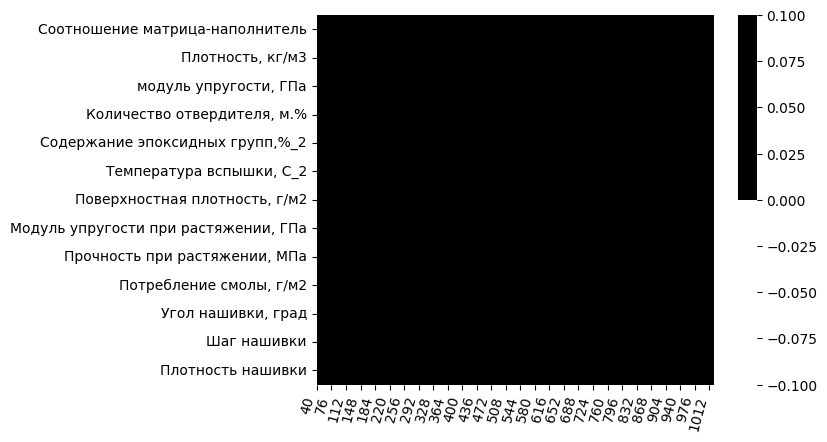

In [23]:
cols = df.columns
colours = ['white', 'black'] #белый показывает пропущенные значения, чёрный - заполненные
sns.heatmap(df[cols].isna().T, cmap = sns.color_palette(colours)) #проверим наличие пропусков на тепловой карте
plt.xticks(rotation = 75, ha = 'right')
plt.show()

In [24]:
#проверим пропуски в каждом из 13 столбцов в процентном соотношении
for col in cols:
    pct_missing = np.mean(df[col].isna())
    print('{} - {}%'.format(col, round(pct_missing*100)))

Соотношение матрица-наполнитель - 0%
Плотность, кг/м3 - 0%
модуль упругости, ГПа - 0%
Количество отвердителя, м.% - 0%
Содержание эпоксидных групп,%_2 - 0%
Температура вспышки, С_2 - 0%
Поверхностная плотность, г/м2 - 0%
Модуль упругости при растяжении, ГПа - 0%
Прочность при растяжении, МПа - 0%
Потребление смолы, г/м2 - 0%
Угол нашивки, град - 0%
Шаг нашивки - 0%
Плотность нашивки - 0%


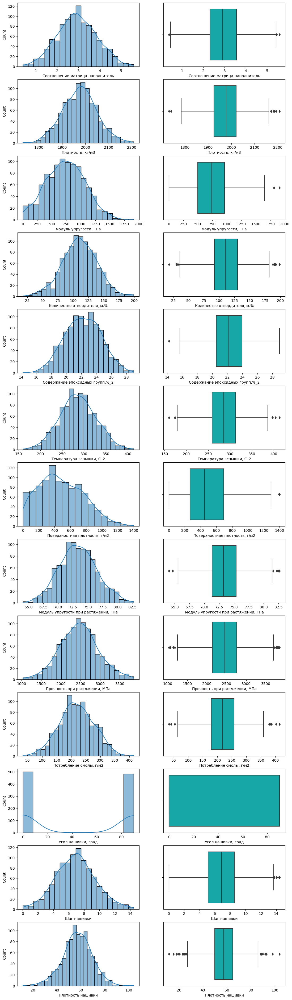

In [25]:
#строим графики распределения переменных и "ящики с усами"
fig, axes = plt.subplots(13, 2, figsize=(13, 48)) #задаём количество строк и столбцов для графиков, задаём размер графиков
for k, column in enumerate(cols): #воспользуемся циклом для отображения наших 13 признаков в двух форматах 
    sns.histplot(data=df, x=column, kde=True, ax=axes[k, 0]) #строим гистограмму, задаём параметры
    sns.boxplot(data=df, x=column, color='c', ax=axes[k, 1]) #строим боксплот
plt.show()

Все признаки, кроме "Угол нашивки, град" имеют нормальное распределение.
Они являются количественными, вещественными. Принимают неотрицательные значения.

"Угол нашивки, град" принимает 2 значения.

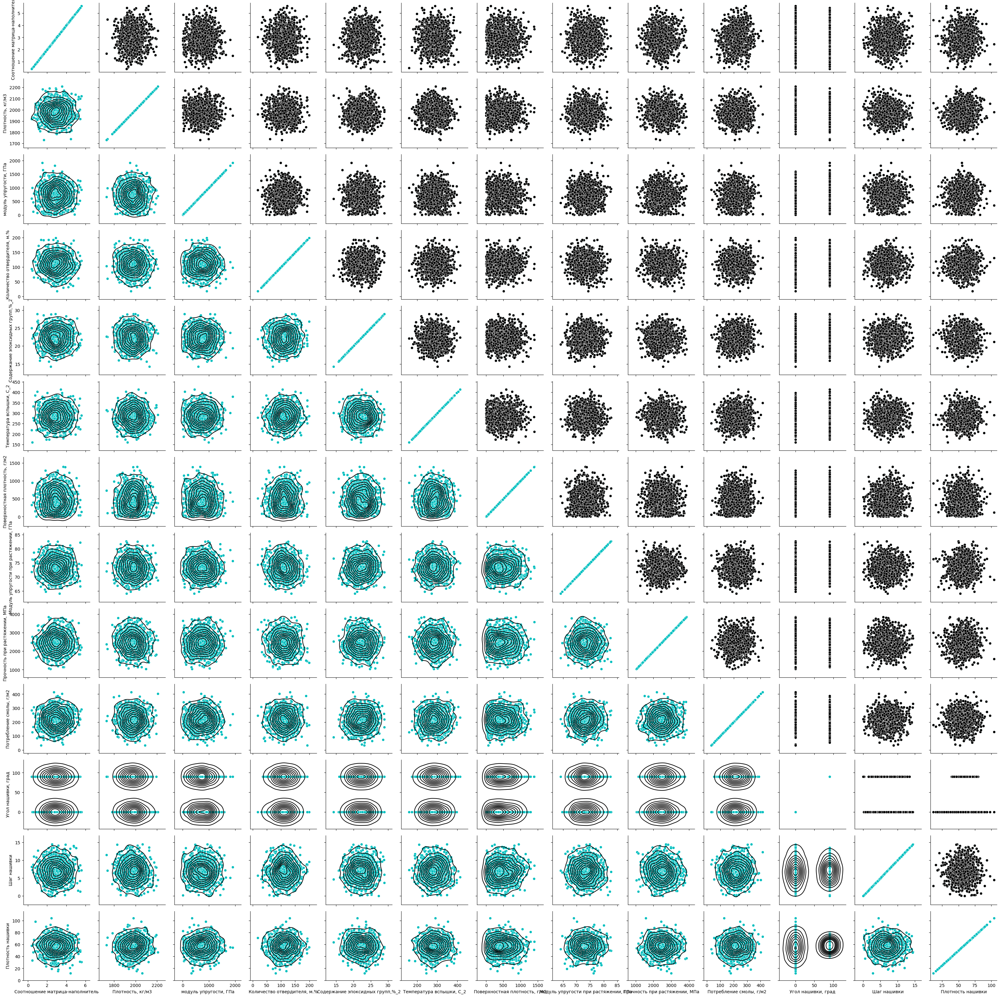

In [26]:
#строим попарные графики рассеивания точек для всех признаков
g = sns.PairGrid(df[df.columns])
g.map(sns.scatterplot, color = 'c')
g.map_upper(sns.scatterplot, color = 'black')
g.map_lower(sns.kdeplot, color = 'black')
plt.show()

### **Работа с выбросами**

явные зависимости между признаками не прослеживаются

Визуализируем выбросы

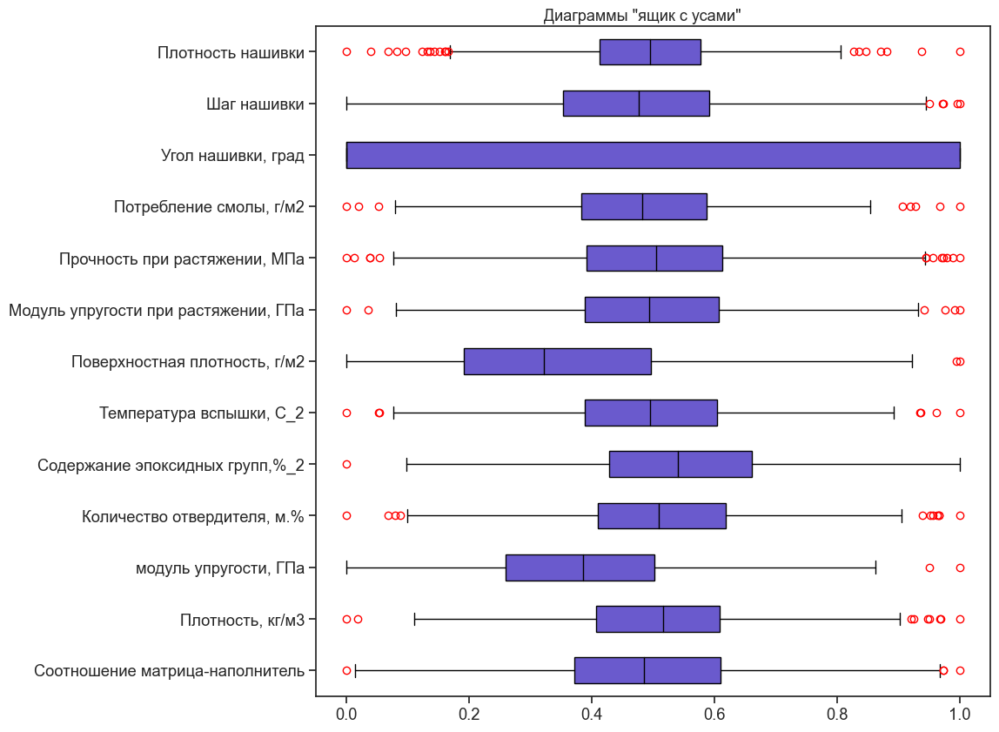

In [27]:
#масштабируем данные, чтобы они находились в одном диапазоне для корректного отображения графиков
scaler = MinMaxScaler()
scaler.fit(df)
sns.set(font_scale=1.2, style='ticks')
plt.figure(figsize = (10, 10))
#для каждого признака построим диаграмму "ящик с усами", где наглядно отбражаются выбросы - значения, отклоняющиеся от медианных, а в нашем случае и средних.
plt.suptitle('Диаграммы "ящик с усами"', y = 0.9,
             fontsize = 13)
plt.boxplot(pd.DataFrame(scaler.transform(df)), labels = df.columns,patch_artist = True, meanline = True, vert = False, boxprops = dict(facecolor = 'SlateBlue', color = 'black'),medianprops = dict(color = 'black'), whiskerprops = dict(color='black'), capprops = dict(color = 'black'), flierprops = dict(color = 'c', markeredgecolor = 'Red'))
plt.show()

#### **Визуализация метрик**

Найдём выбросы двумя разными методами.

Для поиска выбросов воспользуемся методом 3-х сигм и методом межквартильного интервала. Посмотрим, как они отработают на данном наборе данных и выберем результат наиболее предпочтительного.

Соотношение матрица-наполнитель: 3s=0 iq=4


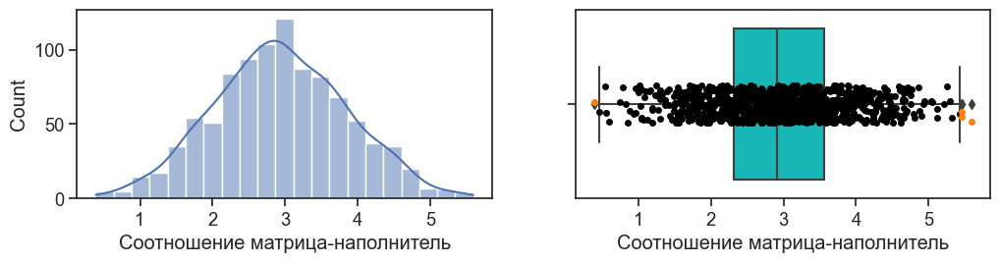

Плотность, кг/м3: 3s=3 iq=9


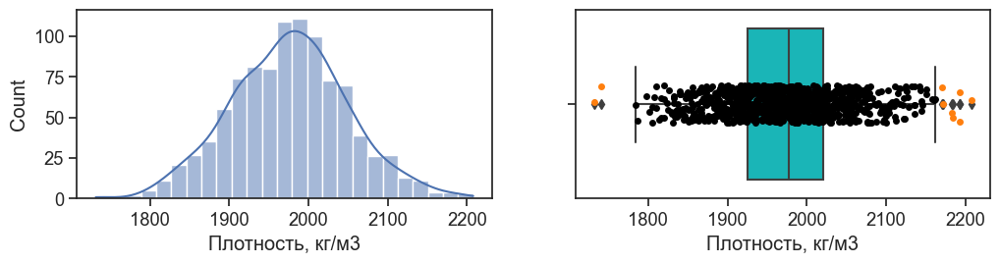

модуль упругости, ГПа: 3s=2 iq=2


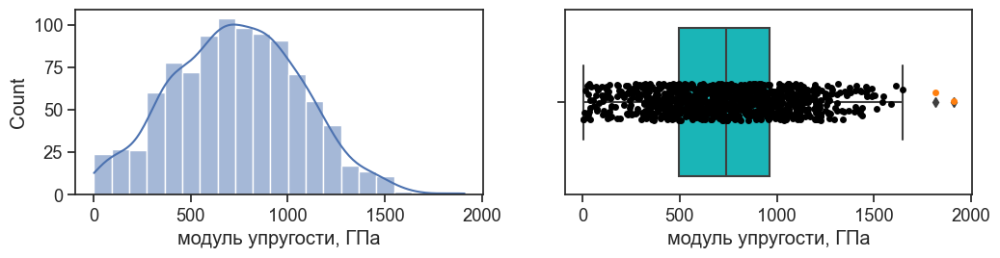

Количество отвердителя, м.%: 3s=2 iq=11


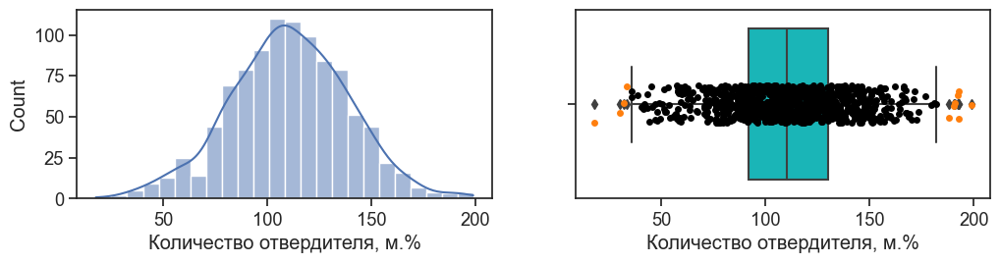

Содержание эпоксидных групп,%_2: 3s=1 iq=1


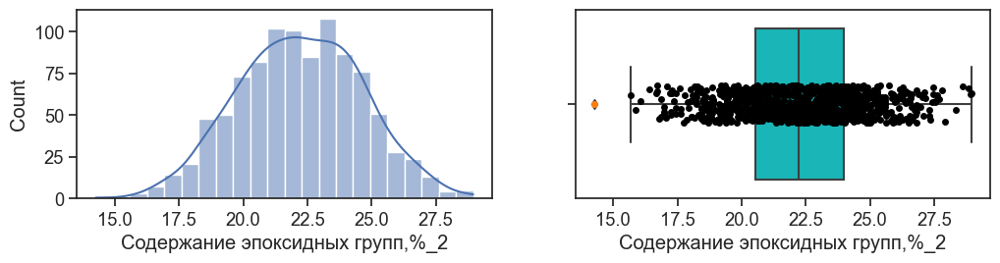

Температура вспышки, С_2: 3s=2 iq=7


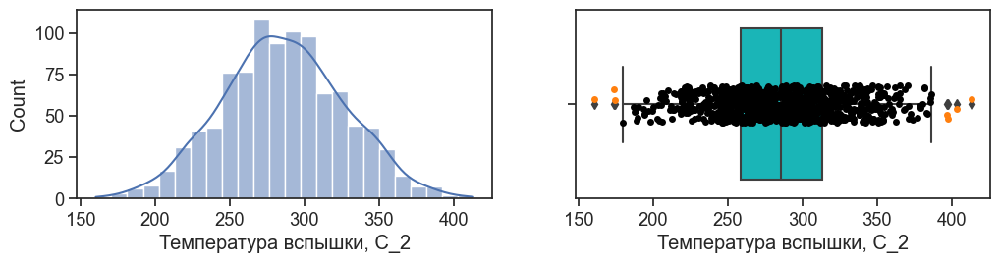

Поверхностная плотность, г/м2: 3s=2 iq=2


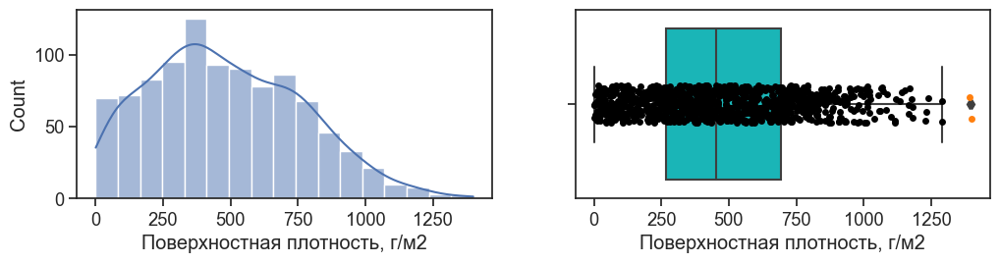

Модуль упругости при растяжении, ГПа: 3s=1 iq=6


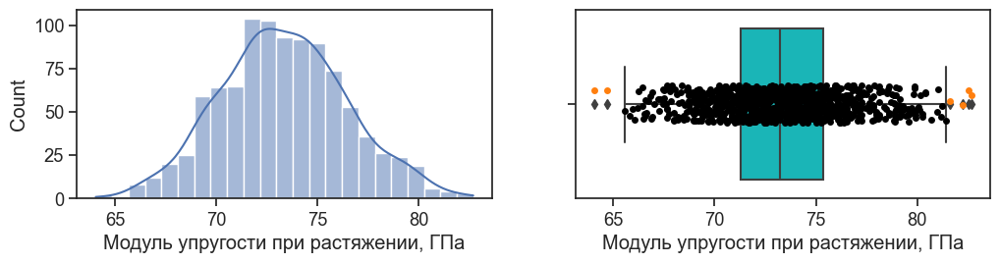

Прочность при растяжении, МПа: 3s=0 iq=13


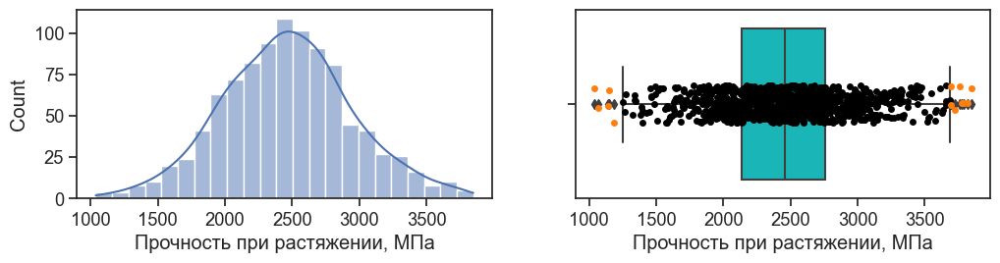

Потребление смолы, г/м2: 3s=3 iq=8


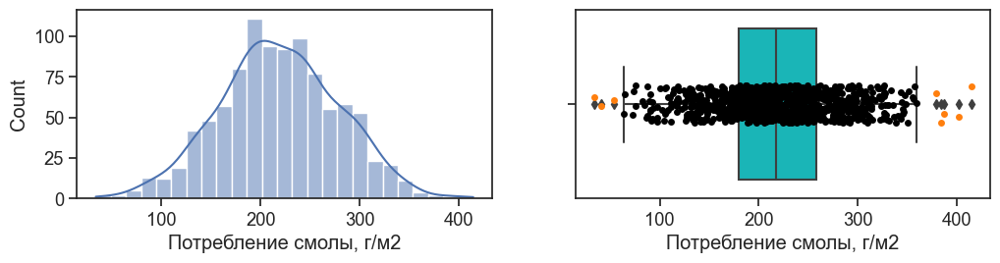

Угол нашивки, град: 3s=0 iq=0


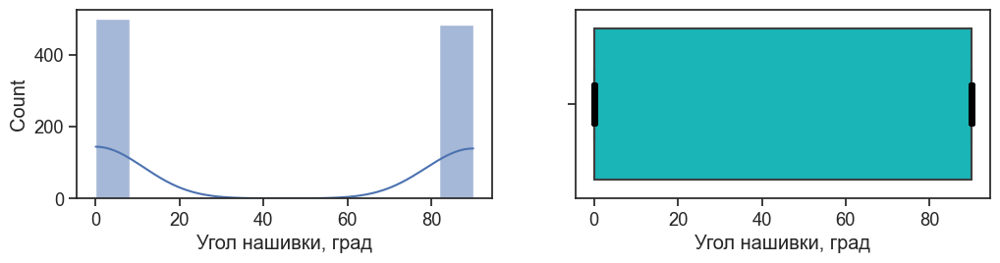

Шаг нашивки: 3s=0 iq=5


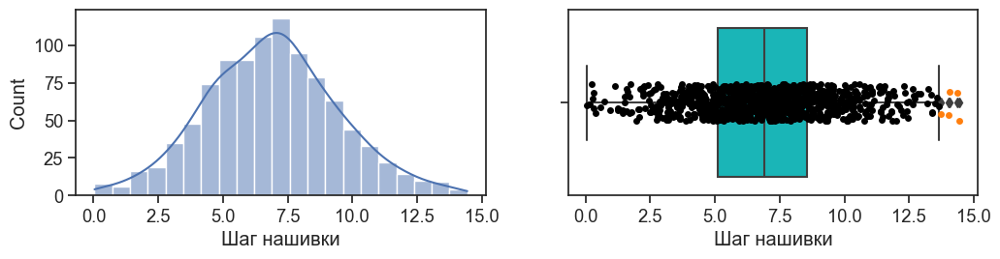

Плотность нашивки: 3s=6 iq=20


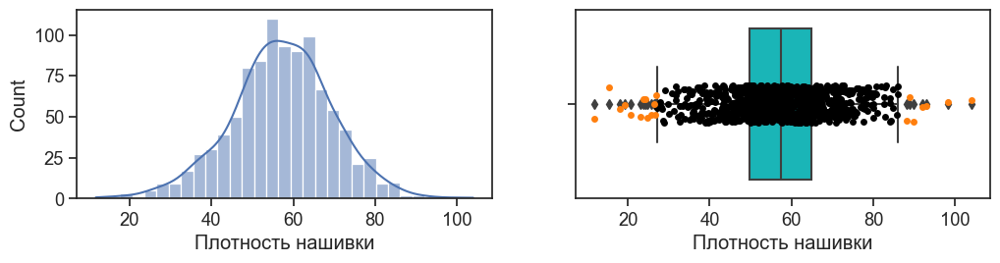

Количество выбросов методом 3-х сигм: 22
Количество выбросов методом межквартильного интервала: 88


In [28]:
count_3s = 0
count_iq = 0
for column in df:
    d = df.loc[:, [column]]
    #метод 3-х сигм
    zscore = (df[column] - df[column].mean()) / df[column].std()
    d['3s'] = zscore.abs() > 3
    count_3s += d['3s'].sum()
    #метод межквартильного интервала
    q1 = np.quantile(df[column], 0.25)
    q3 = np.quantile(df[column], 0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    d['iq'] = (df[column] <= lower) | (df[column] >= upper)
    count_iq += d['iq'].sum()
    #визуализация
    print('{}: 3s={} iq={}'.format(column, d['3s'].sum(), d['iq'].sum()))
    fig, axes = plt.subplots(1, 2, figsize=(12, 2.5))
    sns.histplot(data=d, x=column, palette='crest', multiple='stack', kde=True, legend=False, ax=axes[0])
    sns.boxplot(data=d, x=column, color='DarkTurquoise', ax=axes[1])
    sns.stripplot(data=d[d['iq']==False], x=column, color='black', ax=axes[1])
    sns.stripplot(data=d[d['iq']==True], x=column, color='tab:orange', ax=axes[1])
    plt.show()

print('Количество выбросов методом 3-х сигм:', count_3s)
print('Количество выбросов методом межквартильного интервала:', count_iq)

Результаты:
* Метод 3-х сигм, позволил выявить 22 выброса по всем переменным
* Метод межквартильного интервала, показал нам 88 выбросов

Для наиболее эффективной работы модели, воспользуемся методом межквартильного интервала.

Удаление выбросов

In [29]:
#считаем выбросы методом межквартильного интервала
metod_iq = 0
count_iq = []
for column in df:
    a = df.loc[:, [column]]
    q1 = np.quantile(df[column], 0.25)
    q3 = np.quantile(df[column], 0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    a['iq'] = (df[column] <= lower) | (df[column] >= upper)
    metod_iq += a['iq'].sum()
    count_iq.append(a['iq'].sum())
    print(column + ':', a['iq'].sum())
print('Количество выбросов методом межквартильного интервала:', metod_iq)

Соотношение матрица-наполнитель: 4
Плотность, кг/м3: 9
модуль упругости, ГПа: 2
Количество отвердителя, м.%: 11
Содержание эпоксидных групп,%_2: 1
Температура вспышки, С_2: 7
Поверхностная плотность, г/м2: 2
Модуль упругости при растяжении, ГПа: 6
Прочность при растяжении, МПа: 13
Потребление смолы, г/м2: 8
Угол нашивки, град: 0
Шаг нашивки: 5
Плотность нашивки: 20
Количество выбросов методом межквартильного интервала: 88


In [30]:
#создаём переменную с указанием характеристик с выбросами
column_list_drop = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 'Шаг нашивки', 'Плотность нашивки']
#удалим выбросы методом межквартильного интервала, чтобы не путать модель
for i in column_list_drop:
    q75, q25 = np.percentile(df.loc[:,i], [75,25])
    intr_qr = q75 - q25
    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)
    df.loc[df[i] < min, i] = np.nan
    df.loc[df[i] > max, i] = np.nan

In [31]:
df.isna().sum() #проверяем наличие пропусков после удаления выбросов

Соотношение матрица-наполнитель          4
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             11
Содержание эпоксидных групп,%_2          1
Температура вспышки, С_2                 7
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           13
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              5
Плотность нашивки                       20
dtype: int64

In [32]:
df = df.dropna(axis=0) #удаляем эти строки
df.isna().sum() #проверяем наличие пропусков повторно

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

смотрим сколько осталось строк после удаления выбросов

In [33]:
df.shape

(899, 13)

Посмотрим на корреляцию между признаками после очистки от выбросов

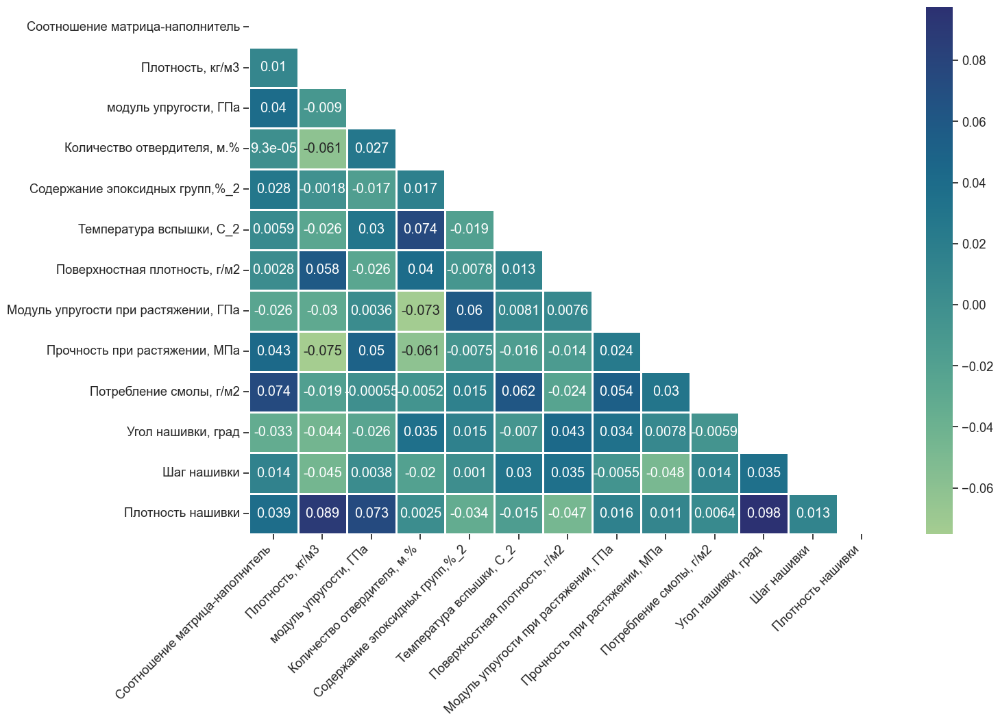

In [34]:
matrix = np.triu(df.corr())
plt.figure(figsize=(15, 10))
sns.heatmap(df.corr(), annot = True, cmap= 'crest', linewidths=1, linecolor='white', mask = matrix)
plt.xticks(rotation = 45, ha = 'right')
plt.show()

максимальная корреляция в 0.098 наблюдается между плотностью нашивки и углом нашивки, то есть зависимостей между признаками практически нет

### В связи с такой незначительной корреляцией перейдём к рассмотрению данного нам датасета ещё раз

#### Проанализировав ещё раз данный нам датасет, мы пришли к выводу что в столбце "Температура вспышки, С_2" имеется всего 13 значений, соответствующих стандарту определенному ASTM International (англоязычная ассоциация по стандартизации), который гласит нам о том, что температура вспышки С2 измеряется круглым термометром с точностью до 0,5 °C. Таким образом, температура вспышки С2 обычно округляется до ближайшего целого числа. Однако, иногда для более точных измерений могут применяться термометры с плавающей точкой, и тогда температура вспышки С2 может быть указана с точностью до десятых или сотых градуса Цельсия. В то время как в нашем датасете имеются нефизичные значения температуры вспышки.

### Исходя из этого проделаем всю процедуру анализа и подготовки данных заново

# **3. Процедура анализа и подготовки данных с удалением нефизичных величин**

In [35]:
df_bp = pd.read_excel('./data/X_bp.xlsx', index_col=0) #загружаем данные из одной таблицы X_bp.xlsx и присваиваем переменную df_bp
df_bp.shape #размерность df_bp

(1023, 10)

In [36]:
df_nup = pd.read_excel('./data/X_nup.xlsx', index_col=0) #загружаем данные из другой таблицы X_nup.xlsx и присваиваем переменную df_nup
df_nup.shape #смотрим размер

(1040, 3)

In [37]:
df = df_bp.join(df_nup, how='inner') #объединяем
df.shape

(1023, 13)

удаляем все значения с нефизичными величинами

In [38]:
df_clean = df[(df["Температура вспышки, С_2"] == 100) | (df["Температура вспышки, С_2"] == 300)] #присвоим новую переменную
df_clean.shape #получаем 13 строк

(13, 13)

In [39]:
df_clean

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.0,22.267857,100.0,210.0,70.000000,3000.000000,220.0,0,4.0,57.0
3,1.857143,2030.0,738.736842,129.0,21.250000,300.0,210.0,70.000000,3000.000000,220.0,0,5.0,47.0
8,3.557018,1930.0,889.000000,129.0,21.250000,300.0,380.0,75.000000,1800.000000,120.0,0,7.0,57.0
9,3.532338,2100.0,1421.000000,129.0,21.250000,300.0,1010.0,78.000000,2000.000000,300.0,0,7.0,60.0
10,2.919678,2160.0,933.000000,129.0,21.250000,300.0,1010.0,78.000000,2000.000000,300.0,0,7.0,70.0
11,2.877358,1990.0,1628.000000,129.0,21.250000,300.0,1010.0,78.000000,2000.000000,300.0,0,9.0,47.0
12,1.598174,1950.0,827.000000,129.0,21.250000,300.0,470.0,73.333333,2455.555556,220.0,0,9.0,57.0
13,2.919678,1980.0,568.000000,129.0,21.250000,300.0,470.0,73.333333,2455.555556,220.0,0,9.0,60.0
14,4.029126,1910.0,800.000000,129.0,21.250000,300.0,470.0,73.333333,2455.555556,220.0,0,9.0,70.0
15,2.934783,2030.0,302.000000,129.0,21.250000,300.0,210.0,70.000000,3000.000000,220.0,0,10.0,47.0


In [40]:
df_clean.isna().sum() #проверяем на пропуски

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

пропуски отсутствуют

In [41]:
df_clean.nunique() #выводим количество уникальных значений в каждом столбце

Соотношение матрица-наполнитель         10
Плотность, кг/м3                        10
модуль упругости, ГПа                   12
Количество отвердителя, м.%              2
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 2
Поверхностная плотность, г/м2            4
Модуль упругости при растяжении, ГПа     4
Прочность при растяжении, МПа            4
Потребление смолы, г/м2                  3
Угол нашивки, град                       1
Шаг нашивки                              5
Плотность нашивки                        4
dtype: int64

теперь данные с обозначением угла нашивки представлены всего одним значением, удаляем этот столбец, так как он уже не несёт в себе никакой значимости для общей выборки ("полный ноль")

In [42]:
df_clean = df_clean.drop(columns = ['Угол нашивки, град'],axis = 1)
df_clean

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.0,22.267857,100.0,210.0,70.000000,3000.000000,220.0,4.0,57.0
3,1.857143,2030.0,738.736842,129.0,21.250000,300.0,210.0,70.000000,3000.000000,220.0,5.0,47.0
8,3.557018,1930.0,889.000000,129.0,21.250000,300.0,380.0,75.000000,1800.000000,120.0,7.0,57.0
9,3.532338,2100.0,1421.000000,129.0,21.250000,300.0,1010.0,78.000000,2000.000000,300.0,7.0,60.0
10,2.919678,2160.0,933.000000,129.0,21.250000,300.0,1010.0,78.000000,2000.000000,300.0,7.0,70.0
11,2.877358,1990.0,1628.000000,129.0,21.250000,300.0,1010.0,78.000000,2000.000000,300.0,9.0,47.0
12,1.598174,1950.0,827.000000,129.0,21.250000,300.0,470.0,73.333333,2455.555556,220.0,9.0,57.0
13,2.919678,1980.0,568.000000,129.0,21.250000,300.0,470.0,73.333333,2455.555556,220.0,9.0,60.0
14,4.029126,1910.0,800.000000,129.0,21.250000,300.0,470.0,73.333333,2455.555556,220.0,9.0,70.0
15,2.934783,2030.0,302.000000,129.0,21.250000,300.0,210.0,70.000000,3000.000000,220.0,10.0,47.0


In [43]:
df_clean.shape

(13, 12)

осталось всего 13 строк и 12 столбцов

**Разведочный анализ очищенных данных**

In [44]:
df_clean.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,13.0,3.133151,0.973349,1.598174,2.877358,2.934783,3.557018,4.897959
"Плотность, кг/м3",13.0,1986.923077,82.197386,1880.000000,1930.000000,1980.000000,2030.000000,2160.000000
"модуль упругости, ГПа",13.0,784.959514,386.777556,302.000000,540.000000,738.736842,889.000000,1628.000000
"Количество отвердителя, м.%",13.0,121.384615,27.457660,30.000000,129.000000,129.000000,129.000000,129.000000
"Содержание эпоксидных групп,%_2",13.0,21.328297,0.282303,21.250000,21.250000,21.250000,21.250000,22.267857
"Температура вспышки, С_2",13.0,284.615385,55.470020,100.000000,300.000000,300.000000,300.000000,300.000000
"Поверхностная плотность, г/м2",13.0,493.846154,311.194967,210.000000,210.000000,380.000000,470.000000,1010.000000
"Модуль упругости при растяжении, ГПа",13.0,73.769231,3.104312,70.000000,70.000000,73.333333,75.000000,78.000000
"Прочность при растяжении, МПа",13.0,2366.666667,499.567714,1800.000000,2000.000000,2455.555556,3000.000000,3000.000000
"Потребление смолы, г/м2",13.0,215.384615,63.850788,120.000000,220.000000,220.000000,220.000000,300.000000


значения признаков имеют очень разный масштаб, поэтому отмасштабируем данные методом **MinMaxScaler**

In [45]:
#для лучшего восприятия, вычислительными машинами, алгоритмов машинного обучения, данные необходимо нормализовать
#так как масштаб данных у нас очень разный воспользуемся методом MinMaxScaler
normalizer = MinMaxScaler()
result = normalizer.fit_transform(df_clean)
df_minmax = pd.DataFrame(result, columns = df_clean.columns) 

In [46]:
df_minmax.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,13.0,0.465175,0.294974,0.0,0.387657,0.405059,0.593628,1.0
"Плотность, кг/м3",13.0,0.381868,0.293562,0.0,0.178571,0.357143,0.535714,1.0
"модуль упругости, ГПа",13.0,0.364223,0.291687,0.0,0.179487,0.329364,0.442685,1.0
"Количество отвердителя, м.%",13.0,0.923077,0.277350,0.0,1.000000,1.000000,1.000000,1.0
"Содержание эпоксидных групп,%_2",13.0,0.076923,0.277350,0.0,0.000000,0.000000,0.000000,1.0
"Температура вспышки, С_2",13.0,0.923077,0.277350,0.0,1.000000,1.000000,1.000000,1.0
"Поверхностная плотность, г/м2",13.0,0.354808,0.388994,0.0,0.000000,0.212500,0.325000,1.0
"Модуль упругости при растяжении, ГПа",13.0,0.471154,0.388039,0.0,0.000000,0.416667,0.625000,1.0
"Прочность при растяжении, МПа",13.0,0.472222,0.416306,0.0,0.166667,0.546296,1.000000,1.0
"Потребление смолы, г/м2",13.0,0.529915,0.354727,0.0,0.555556,0.555556,0.555556,1.0


In [47]:
df_minmax.nunique()

Соотношение матрица-наполнитель         10
Плотность, кг/м3                        10
модуль упругости, ГПа                   12
Количество отвердителя, м.%              2
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 2
Поверхностная плотность, г/м2            4
Модуль упругости при растяжении, ГПа     4
Прочность при растяжении, МПа            4
Потребление смолы, г/м2                  3
Шаг нашивки                              5
Плотность нашивки                        4
dtype: int64

взглянем на описательную статистику очищенного и отмасштабированного датасетика

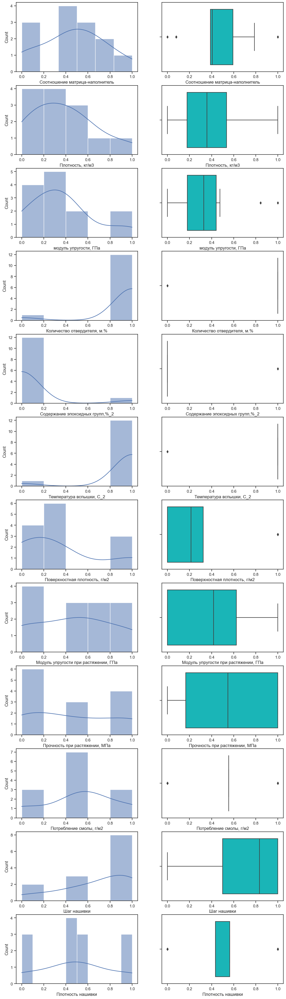

In [48]:
cols = df_minmax.columns
#строим графики распределения переменных и "ящики с усами"
sns.set(font_scale=1, style='ticks')
fig, axes = plt.subplots(12, 2, figsize=(13, 48)) #задаём количество строк и столбцов для графиков, задаём размер графиков
for k, column in enumerate(cols): #воспользуемся циклом для отображения наших 13 признаков в двух форматах 
    sns.histplot(data=df_minmax, x=column, kde=True, ax=axes[k, 0]) #строим гистограмму, задаём параметры
    sns.boxplot(data=df_minmax, x=column, color='DarkTurquoise', ax=axes[k, 1]) #строим боксплот
plt.show()

в связи с тем что у нас очень маленький датасет, графики распределения не несут в себе полезной информации

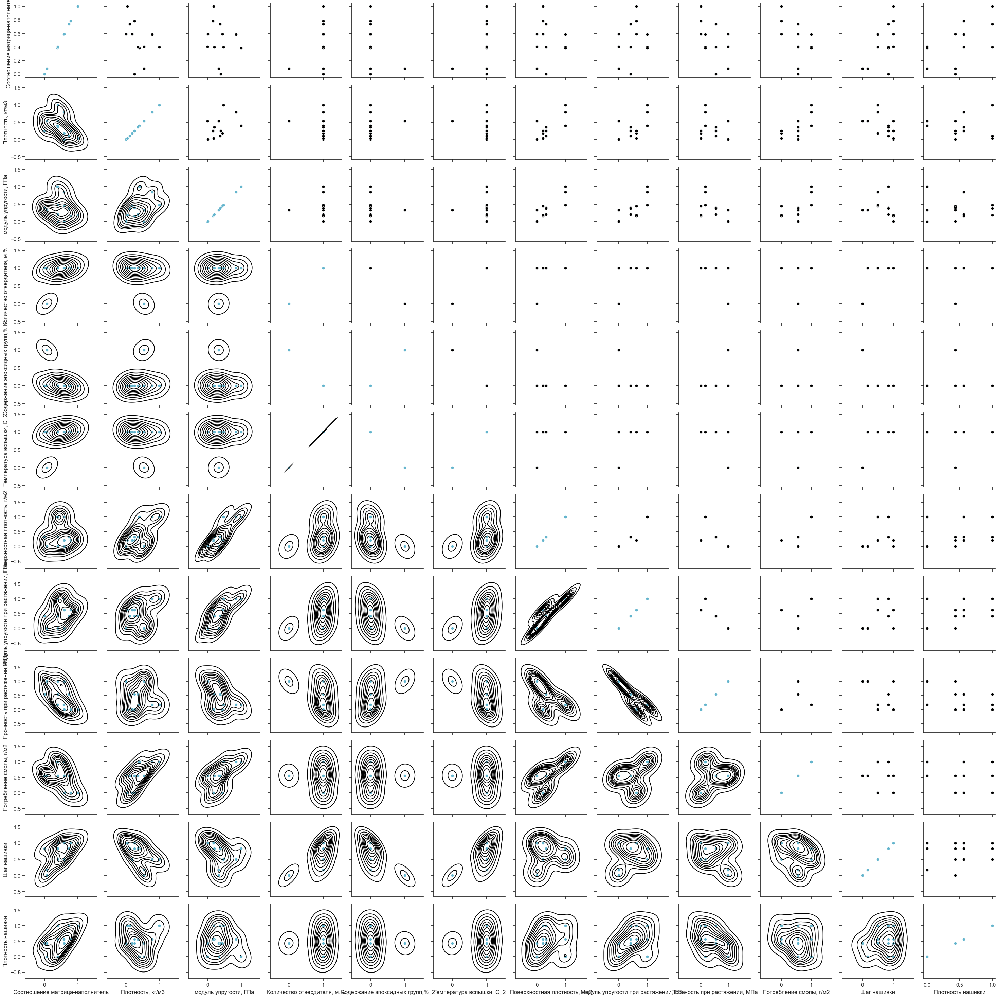

In [49]:
#строим попарные графики рассеивания точек для всех признаков
g = sns.PairGrid(df_minmax)
g.map(sns.scatterplot, color = 'c')
g.map_upper(sns.scatterplot, color = 'black')
g.map_lower(sns.kdeplot, color = 'black')
plt.show()

данных очень мало

смотрим корреляцию между признаками

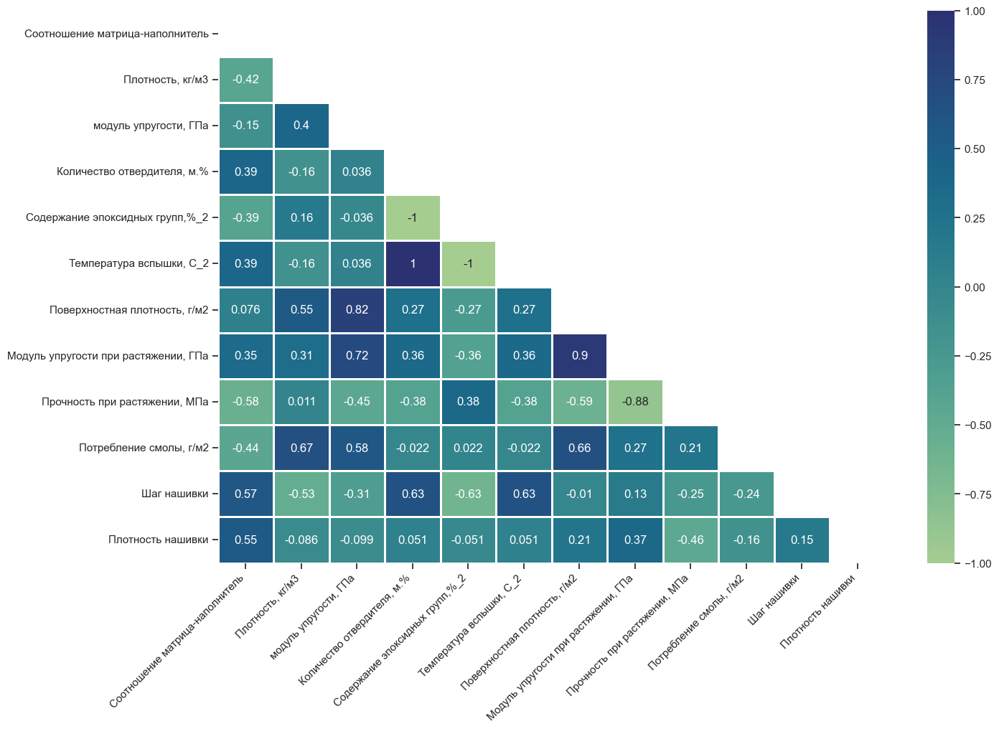

In [50]:
matrix = np.triu(df_minmax.corr())
plt.figure(figsize=(15, 10))
sns.heatmap(df_minmax.corr(), annot = True, cmap= 'crest', linewidths=1, linecolor='white', mask = matrix)
plt.xticks(rotation = 45, ha = 'right')
plt.show()

вот и появились некоторые зависимости между признаками, как отрицательные так и положительные, значит мы на верном пути

In [51]:
df_minmax = df_minmax.reset_index(drop=True) #для удобства переиндексируем строки
df_minmax

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
0,0.078481,0.535714,0.329364,0.0,1.0,0.0,0.0000,0.000000,1.000000,0.555556,0.000000,0.434783
1,0.078481,0.535714,0.329364,1.0,0.0,1.0,0.0000,0.000000,1.000000,0.555556,0.166667,0.000000
2,0.593628,0.178571,0.442685,1.0,0.0,1.0,0.2125,0.625000,0.000000,0.000000,0.500000,0.434783
3,0.586149,0.785714,0.843891,1.0,0.0,1.0,1.0000,1.000000,0.166667,1.000000,0.500000,0.565217
4,0.400482,1.000000,0.475867,1.0,0.0,1.0,1.0000,1.000000,0.166667,1.000000,0.500000,1.000000
5,0.387657,0.392857,1.000000,1.0,0.0,1.0,1.0000,1.000000,0.166667,1.000000,0.833333,0.000000
6,0.000000,0.250000,0.395928,1.0,0.0,1.0,0.3250,0.416667,0.546296,0.555556,0.833333,0.434783
7,0.400482,0.357143,0.200603,1.0,0.0,1.0,0.3250,0.416667,0.546296,0.555556,0.833333,0.565217
8,0.736700,0.107143,0.375566,1.0,0.0,1.0,0.3250,0.416667,0.546296,0.555556,0.833333,1.000000
9,0.405059,0.535714,0.000000,1.0,0.0,1.0,0.0000,0.000000,1.000000,0.555556,1.000000,0.000000


<Axes: ylabel='Density'>

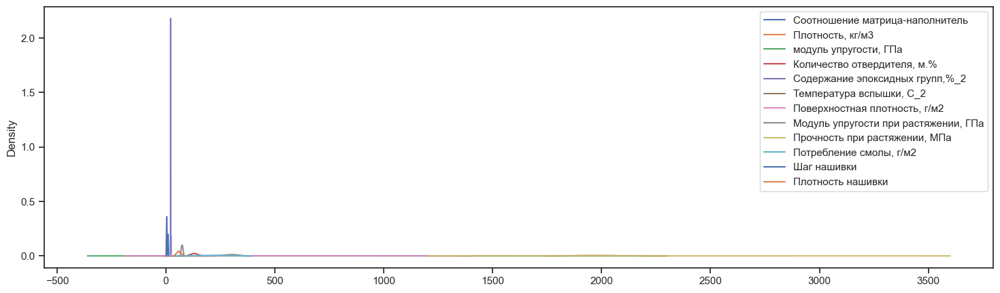

In [52]:
#строим график ядерной оценки плотности наших признаков до нормализации
fig, ax = plt.subplots(figsize = (18, 5))
df_clean.plot(kind = 'kde', ax = ax)

<Axes: ylabel='Density'>

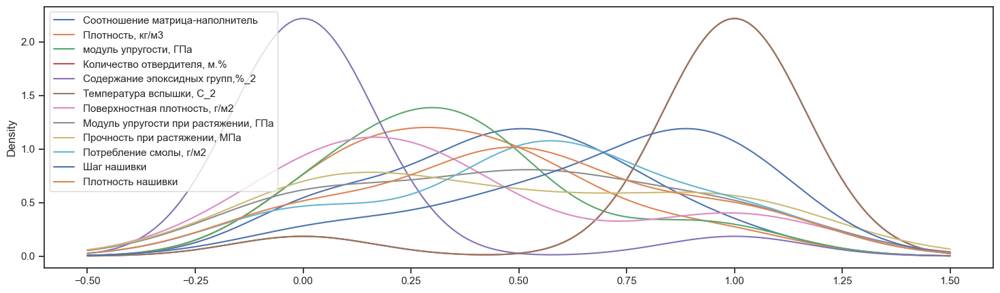

In [53]:
#строим график ядерной оценки плотности наших признаков после нормализации
fig, ax = plt.subplots(figsize = (18, 5))
df_minmax.plot(kind = 'kde', ax = ax)

In [54]:
df_minmax.describe().T #смотрим, как выглядит нормализованный датасет

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,13.0,0.465175,0.294974,0.0,0.387657,0.405059,0.593628,1.0
"Плотность, кг/м3",13.0,0.381868,0.293562,0.0,0.178571,0.357143,0.535714,1.0
"модуль упругости, ГПа",13.0,0.364223,0.291687,0.0,0.179487,0.329364,0.442685,1.0
"Количество отвердителя, м.%",13.0,0.923077,0.277350,0.0,1.000000,1.000000,1.000000,1.0
"Содержание эпоксидных групп,%_2",13.0,0.076923,0.277350,0.0,0.000000,0.000000,0.000000,1.0
"Температура вспышки, С_2",13.0,0.923077,0.277350,0.0,1.000000,1.000000,1.000000,1.0
"Поверхностная плотность, г/м2",13.0,0.354808,0.388994,0.0,0.000000,0.212500,0.325000,1.0
"Модуль упругости при растяжении, ГПа",13.0,0.471154,0.388039,0.0,0.000000,0.416667,0.625000,1.0
"Прочность при растяжении, МПа",13.0,0.472222,0.416306,0.0,0.166667,0.546296,1.000000,1.0
"Потребление смолы, г/м2",13.0,0.529915,0.354727,0.0,0.555556,0.555556,0.555556,1.0


In [55]:
df_clean.describe().T #смотрим, как выглядит датасет, без нормализации (шкалирования)

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,13.0,3.133151,0.973349,1.598174,2.877358,2.934783,3.557018,4.897959
"Плотность, кг/м3",13.0,1986.923077,82.197386,1880.000000,1930.000000,1980.000000,2030.000000,2160.000000
"модуль упругости, ГПа",13.0,784.959514,386.777556,302.000000,540.000000,738.736842,889.000000,1628.000000
"Количество отвердителя, м.%",13.0,121.384615,27.457660,30.000000,129.000000,129.000000,129.000000,129.000000
"Содержание эпоксидных групп,%_2",13.0,21.328297,0.282303,21.250000,21.250000,21.250000,21.250000,22.267857
"Температура вспышки, С_2",13.0,284.615385,55.470020,100.000000,300.000000,300.000000,300.000000,300.000000
"Поверхностная плотность, г/м2",13.0,493.846154,311.194967,210.000000,210.000000,380.000000,470.000000,1010.000000
"Модуль упругости при растяжении, ГПа",13.0,73.769231,3.104312,70.000000,70.000000,73.333333,75.000000,78.000000
"Прочность при растяжении, МПа",13.0,2366.666667,499.567714,1800.000000,2000.000000,2455.555556,3000.000000,3000.000000
"Потребление смолы, г/м2",13.0,215.384615,63.850788,120.000000,220.000000,220.000000,220.000000,300.000000


Таким образом, мы проанализировали и нормализовали наш очищенный датасет, а так же обнаружили явные зависимости между признаками

# **4. Обучение моделей**

In [56]:
import sklearn
from sklearn.linear_model import LinearRegression, Ridge, LassoCV, RidgeCV, ElasticNetCV
from sklearn import preprocessing
from sklearn.compose import TransformedTargetRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import make_pipeline, Pipeline
import pickle
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.models import Sequential 
from tensorflow.keras.optimizers import Adam

### С целью прогноза целевых признаков было выбрано десять методов для решения нашей регрессионной задачи:
- LinearRegression — линейная регрессия;
- LASSO — лассо регрессия;
- Ridge — гребневая регрессия;
- ElasticNet — регрессия эластичная сеть;
- RandomForestRegressor — случайный лес;
- KneighborsRegressor — метод ближайших соседей;
- SVR — метод опорных векторов;
- GradientBoostingRegressor — градиентный бустинг;
- DecisionTreeRegressor — деревья решений;
- Созданная нами нейросеть.


### По каждому целевому признаку посчитаем и выведем метрики, используемые для оценки точности работы модели:
- среднюю квадратичную ошибку (MSE);
- среднюю абсолютную ошибку (MAE);
- коэффициент детерминации (R2) на тренировочной выборке;
- коэффициент детерминации (R2) на тестовой выборке.

Выбирать наиболее удачные модели будем с помощью метрики R2 на тестовой выборке.

#### **Разбиение на обучающую и тестовую выборки для прогноза модуля упругости при растяжении (upr)**

In [57]:
#Прогнозируемые величины "Модуль упругости при растяжении, ГПа" и "Модуль прочности при растяжении, МПа", а также все признаки, 
#за исключением столбца "Угол нашивки", являются непрерывными. Следовательно, для решения задачи такого типа будем
#использовать различные модели регрессии. Но так как в данных нет явной корреляции между признаками, то
#регрессионная модель может не дать хорошего прогноза. В таком случае можно использовать более сложные модели, 
#способные выявить взаимосвязь между признаками. Для таких целей хорошо подойдет модель случайного леса. В виду большого 
#числа признаков, находящихся в разных измерениях неплохим выбором будет метод k-ближайших соседей. По условию задачи,
#необходимо реализовать многослойную нейронную сеть, которая также должна хорошо обобщиться на многомерном датасете, 
#попытавшись выявить новые зависимости между признаками.

#Для обучения моделей прогнозирующих целевой признак "Модуль упругости при растяжении, ГПа" разобьем его на обучающий и 
#тестовый набор данных, так, чтобы в тренировочной части датасета остались все значения кроме тех которые будем предсказывать,
#а в тестовой части только предсказываемые значения.

X_upr = df_minmax.drop(['Модуль упругости при растяжении, ГПа'], axis=1)
y_upr = df_minmax[['Модуль упругости при растяжении, ГПа']]

#разбиение на обучающую и тестовую выборки для прогноза модуля упругости при растяжении
X_train_upr, X_test_upr, y_train_upr, y_test_upr = train_test_split(X_upr, y_upr, test_size=0.3, random_state=1)

проверяем размерность получившихся выборок

In [58]:
print(X_train_upr.shape, X_test_upr.shape, y_train_upr.shape, y_test_upr.shape)

(9, 11) (4, 11) (9, 1) (4, 1)


размерности совпадают

##### **Линейная регрессия для прогноза upr**

In [59]:
#Линейная регрессия является классическим и наиболее известным алгоритмом регрессии. Однако,
#линейная регрессия часто неприменима к реальным данным из-за слишком ограниченных возможностей
lr = LinearRegression()

#обучаем модель для предсказания признака "Модуль упругости при растяжении"
lr.fit(X_train_upr, y_train_upr.iloc[:, 0])
lr_pred_upr = lr.predict(X_test_upr)
lr_mae_upr = mean_absolute_error(lr_pred_upr, y_test_upr)
lr_mse_upr = mean_squared_error(y_test_upr, lr_pred_upr)
lr_r2_train_upr = lr.score(X_train_upr, y_train_upr)
lr_r2_upr = r2_score(y_test_upr, lr_pred_upr)
print('LinearRegression Results')
print(f'mae: {lr_mae_upr.round(3)}')
print(f'mse: {lr_mse_upr.round(3)}')
print(f'R2 на тренировочной выборке: {lr_r2_train_upr.round(3)}')
print(f'R2 на тестовой выборке: {lr_r2_upr.round(3)}')

LinearRegression Results
mae: 0.0
mse: 0.0
R2 на тренировочной выборке: 1.0
R2 на тестовой выборке: 1.0


##### **LASSO-регрессия для прогноза upr**

In [60]:
#LASSO (Least Absolute Shrinkage and Selection Operator) — это вариация линейной регрессии
#LASSO использует сжатие коэффициентов (shrinkage) - процесс, в котором значения данных приближаются к центральной точке.
LCV = LassoCV()

#обучаем модель для предсказания признака "Модуль упругости при растяжении"
LCV.fit(X_train_upr, y_train_upr.iloc[:, 0])
LCV_pred_upr = LCV.predict(X_test_upr)
LCV_mae_upr = mean_absolute_error(LCV_pred_upr, y_test_upr)
LCV_mse_upr = mean_squared_error(y_test_upr, LCV_pred_upr)
LCV_r2_train_upr = LCV.score(X_train_upr, y_train_upr)
LCV_r2_upr = r2_score(y_test_upr, LCV_pred_upr)
print('LassoCV Results')
print(f'mae: {LCV_mae_upr.round(3)}')
print(f'mse: {LCV_mse_upr.round(3)}')
print(f'R2 на тренировочной выборке: {LCV_r2_train_upr.round(3)}')
print(f'R2 на тестовой выборке: {LCV_r2_upr.round(3)}')

LassoCV Results
mae: 0.001
mse: 0.0
R2 на тренировочной выборке: 1.0
R2 на тестовой выборке: 1.0


##### **Гребневая регрессия для прогноза upr**

In [61]:
#Гребневая регрессия или ридж-регрессия очень похожа на регрессию LASSO в том, что она применяет сжатие
#однако самое большое различие между ними в том, что гребневая регрессия использует регуляризацию L2, 
#то есть ни один из коэффициентов не становится нулевым, по сравнению с тем как это происходит в регрессии LASSO
ridge = RidgeCV()

#обучаем модель для предсказания признака "Модуль упругости при растяжении"
ridge.fit(X_train_upr, y_train_upr.iloc[:, 0])
ridge_pred_upr = ridge.predict(X_test_upr)
ridge_mae_upr = mean_absolute_error(ridge_pred_upr, y_test_upr)
ridge_mse_upr = mean_squared_error(y_test_upr, ridge_pred_upr)
ridge_r2_train_upr = ridge.score(X_train_upr, y_train_upr)
ridge_r2_upr = r2_score(y_test_upr, ridge_pred_upr)
print('RidgeCV Results')
print(f'mae: {ridge_mae_upr.round(3)}')
print(f'mse: {ridge_mse_upr.round(3)}')
print(f'R2 на тренировочной выборке: {ridge_r2_train_upr.round(3)}')
print(f'R2 на тестовой выборке: {ridge_r2_upr.round(3)}')

RidgeCV Results
mae: 0.09
mse: 0.013
R2 на тренировочной выборке: 0.995
R2 на тестовой выборке: 0.925


##### **ElasticNet регрессия для прогноза upr**

In [62]:
#ElasticNet стремится объединить лучшее из гребневой регрессии и регрессии лассо, комбинируя регуляризацию L1 и L2
elastic = ElasticNetCV()

#обучаем модель для предсказания признака "Модуль упругости при растяжении"
elastic.fit(X_train_upr, y_train_upr.iloc[:, 0])
elastic_pred_upr = (elastic.predict(X_test_upr))
elastic_mae_upr = mean_absolute_error(elastic_pred_upr, y_test_upr)
elastic_mse_upr = mean_squared_error(y_test_upr, elastic_pred_upr)
elastic_r2_train_upr = elastic.score(X_train_upr, y_train_upr)
elastic_r2_upr = r2_score(y_test_upr, elastic_pred_upr)
print('ElasticNetCV Results')
print(f'mae: {elastic_mae_upr.round(3)}')
print(f'mse: {elastic_mse_upr.round(3)}')
print(f'R2 на тренировочной выборке: {elastic_r2_train_upr.round(3)}')
print(f'R2 на тестовой выборке: {elastic_r2_upr.round(3)}')

ElasticNetCV Results
mae: 0.001
mse: 0.0
R2 на тренировочной выборке: 1.0
R2 на тестовой выборке: 1.0


##### **Случайный лес для прогноза upr**

нарушим условие нашего задания где указано что количество блоков для поиска гиперпараметров должно быть равно 10, в связи с тем что наш датасетик включает в себя всего 9 обучающих строчек, а количество разбиений на блоки не может превышать количество обучающих строк. тогда укажем количество блоков 9 (cv=9)

In [63]:
#из-за специфической и высокодисперсной природы регрессии, просто как задачи машинного обучения, 
#регрессоры дерева решений следует тщательно обрезать. для поиска оптимальной глубины дерева необходимо применить
#инструмент оптимизации поиска параметров GridSearchCV

#параметры, подаваемые на перекрестную проверку методу поиска по сетке
rfr_param_grid = {'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'],
                  'n_estimators': [1, 10, 20],
                  'max_depth': [1, 2, 5]}

#задаём параметры поиска лучшей комбинации гиперпараметров
rfr_gs_upr = GridSearchCV(RandomForestRegressor(), rfr_param_grid, cv=9, n_jobs=-1, verbose=1)

rfr_gs_upr.fit(X_train_upr, y_train_upr.iloc[:, 0]) #применяем поиск
print(f"Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' {rfr_gs_upr.best_params_}") #выводим лучшие параметры для наших выборок

Fitting 9 folds for each of 36 candidates, totalling 324 fits
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' {'criterion': 'squared_error', 'max_depth': 1, 'n_estimators': 1}


In [64]:
#обучаем модель для предсказания признака "Модуль упругости при растяжении"
rfr = RandomForestRegressor(criterion='squared_error', n_estimators=1, max_depth=1)
rfr.fit(X_train_upr, y_train_upr.iloc[:, 0])
rfr_pred_upr = rfr.predict(X_test_upr)
rfr_mae_upr = mean_absolute_error(rfr_pred_upr, y_test_upr)
rfr_mse_upr = mean_squared_error(y_test_upr, rfr_pred_upr)
rfr_r2_train_upr = rfr.score(X_train_upr, y_train_upr)
rfr_r2_upr = r2_score(y_test_upr, rfr_pred_upr)
print('RandomForestRegressor Results')
print(f'mae: {rfr_mae_upr.round(3)}')
print(f'mse: {rfr_mse_upr.round(3)}')
print(f'R2 на тренировочной выборке: {rfr_r2_train_upr.round(3)}')
print(f'R2 на тестовой выборке: {rfr_r2_upr.round(3)}')

RandomForestRegressor Results
mae: 0.156
mse: 0.052
R2 на тренировочной выборке: 0.399
R2 на тестовой выборке: 0.691


##### **k-ближайших соседей для прогноза upr**

In [65]:
#регрессия на основе соседей может использоваться в случаях, когда метки данных являются непрерывными, 
#а не дискретными переменными. метка, присвоенная точке запроса, вычисляется на основе среднего значения 
#меток её ближайших соседей.

#метод ближайших соседей также имеет гиперпараметр, который необходимо передать методу GridSearchCV в целях подбора его
#наилучшего значения.

KNeighbors = list(range(1, 31))
knn_param_grid = {'n_neighbors': range(1, 31)}

#задаём параметры поиска лучшей комбинации гиперпараметров
knn_gs_upr = GridSearchCV(KNeighborsRegressor(), knn_param_grid, cv=9, n_jobs=-1, verbose=1)

knn_gs_upr.fit(X_train_upr, y_train_upr.iloc[:, 0]) #применяем поиск
print(f"Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' {knn_gs_upr.best_params_}") #выводим лучшие параметры для наших выборок

Fitting 9 folds for each of 30 candidates, totalling 270 fits
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' {'n_neighbors': 1}


In [66]:
#обучаем модель для предсказания признака "Модуль упругости при растяжении" установив гиперпараметр
knn = KNeighborsRegressor(n_neighbors=1)
knn.fit(X_train_upr, y_train_upr.iloc[:, 0])
knn_pred_upr = knn.predict(X_test_upr)
knn_mae_upr = mean_absolute_error(knn_pred_upr, y_test_upr)
knn_mse_upr = mean_squared_error(y_test_upr, knn_pred_upr)
knn_r2_train_upr = knn.score(X_train_upr, y_train_upr)
knn_r2_upr = r2_score(y_test_upr, knn_pred_upr)
print('KNeighborsRegressor Results')
print(f'mae: {knn_mae_upr.round(3)}')
print(f'mse: {knn_mse_upr.round(3)}')
print(f'R2 на тренировочной выборке: {knn_r2_train_upr.round(3)}')
print(f'R2 на тестовой выборке: {knn_r2_upr.round(3)}')

KNeighborsRegressor Results
mae: 0.146
mse: 0.085
R2 на тренировочной выборке: 1.0
R2 на тестовой выборке: 0.491


##### **Метод опорных векторов (SVR) для прогноза upr**

In [67]:
#параметры, подаваемые на перекрестную проверку методу поиска по сетке
svr_param_grid = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
      'C': [0.00000001, 0.0000001, 0.000001, 0.00001, 0.0001, 0.001, 0.005, 0.01, 0.1, 0.5]}

#поиск лучшей комбинации гиперпараметров
svr_gs_upr = GridSearchCV(SVR(), svr_param_grid, cv=9, n_jobs=-1, verbose=1)

svr_gs_upr.fit(X_train_upr, y_train_upr.iloc[:, 0]) #применяем поиск
print(f"Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' {svr_gs_upr.best_params_}") #выводим лучшие параметры для наших выборок

Fitting 9 folds for each of 40 candidates, totalling 360 fits
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' {'C': 1e-08, 'kernel': 'linear'}


In [68]:
#обучаем модель для предсказания признака "Модуль упругости при растяжении"
svr = SVR(C=1e-08, kernel='linear')
svr.fit(X_train_upr, y_train_upr.iloc[:, 0])
svr_pred_upr = svr.predict(X_test_upr)
svr_mae_upr = mean_absolute_error(svr_pred_upr, y_test_upr)
svr_mse_upr = mean_squared_error(y_test_upr, svr_pred_upr)
svr_r2_train_upr = svr.score(X_train_upr, y_train_upr)
svr_r2_upr = r2_score(y_test_upr, svr_pred_upr)
print('SVR Results')
print(f'mae: {svr_mae_upr.round(3)}')
print(f'mse: {svr_mse_upr.round(3)}')
print(f'R2 на тренировочной выборке: {svr_r2_train_upr.round(3)}')
print(f'R2 на тестовой выборке: {svr_r2_upr.round(3)}')

SVR Results
mae: 0.448
mse: 0.224
R2 на тренировочной выборке: -0.007
R2 на тестовой выборке: -0.344


##### **Градиентный бустинг (GradientBoosting) для прогноза upr**

In [69]:
#параметры, подаваемые на перекрестную проверку методу поиска по сетке
gb_param_grid = {'loss': ['squared_error', 'absolute_error', 'huber', 'quantile'], 
                  'n_estimators': [1, 2, 5, 10],
                  'max_depth': [1, 2, 3, 4, 5],
                  'max_features': [1, 2, 5, 10]}

#поиск лучшей комбинации гиперпараметров
gb_gs_upr = GridSearchCV(GradientBoostingRegressor(), gb_param_grid, cv=9, 
                   n_jobs=-1, verbose=1)

gb_gs_upr.fit(X_train_upr, y_train_upr.iloc[:, 0])
print(f"Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' {gb_gs_upr.best_params_}")

Fitting 9 folds for each of 320 candidates, totalling 2880 fits
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' {'loss': 'squared_error', 'max_depth': 1, 'max_features': 1, 'n_estimators': 1}


In [70]:
gb = GradientBoostingRegressor(loss='squared_error', max_depth=1, max_features=1, n_estimators=1)
gb.fit(X_train_upr, y_train_upr.iloc[:, 0])
gb_pred_upr = gb.predict(X_test_upr)
gb_mae_upr = mean_absolute_error(gb_pred_upr, y_test_upr)
gb_mse_upr = mean_squared_error(y_test_upr, gb_pred_upr)
gb_r2_train_upr = gb.score(X_train_upr, y_train_upr)
gb_r2_upr = r2_score(y_test_upr, gb_pred_upr)
print('GradientBoostingRegressor Results')
print(f'mae: {gb_mae_upr.round(3)}')
print(f'mse: {gb_mse_upr.round(3)}')
print(f'R2 на тренировочной выборке: {gb_r2_train_upr.round(3)}')
print(f'R2 на тестовой выборке: {gb_r2_upr.round(3)}')

GradientBoostingRegressor Results
mae: 0.438
mse: 0.217
R2 на тренировочной выборке: 0.137
R2 на тестовой выборке: -0.302


##### **Деревья решений (DecisionTreeRegressor) для прогноза upr**

In [71]:
dtr_param_grid = {'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
                  'splitter': ['best', 'random'],
                  'max_depth': [1, 2, 3, 4, 5, 7, 9, 12],
                  'max_features': range(1, 15, 1)}

dtr_gs_upr = GridSearchCV(DecisionTreeRegressor(), dtr_param_grid, cv=9, 
                   n_jobs=-1, verbose=1)

dtr_gs_upr.fit(X_train_upr, y_train_upr.iloc[:, 0])
print(f"Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' {dtr_gs_upr.best_params_}")

Fitting 9 folds for each of 896 candidates, totalling 8064 fits
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' {'criterion': 'squared_error', 'max_depth': 1, 'max_features': 1, 'splitter': 'best'}


In [72]:
dtr = DecisionTreeRegressor(criterion='squared_error', max_depth=1, max_features=1, splitter='best')
dtr.fit(X_train_upr, y_train_upr.iloc[:, 0])
dtr_pred_upr = dtr.predict(X_test_upr)
dtr_mae_upr = mean_absolute_error(dtr_pred_upr, y_test_upr)
dtr_mse_upr = mean_squared_error(y_test_upr, dtr_pred_upr)
dtr_r2_train_upr = dtr.score(X_train_upr, y_train_upr)
dtr_r2_upr = r2_score(y_test_upr, dtr_pred_upr)
print('DecisionTreeRegressor Results')
print(f'mae: {dtr_mae_upr.round(3)}')
print(f'mse: {dtr_mse_upr.round(3)}')
print(f'R2 на тренировочной выборке: {dtr_r2_train_upr.round(3)}')
print(f'R2 на тестовой выборке: {dtr_r2_upr.round(3)}')

DecisionTreeRegressor Results
mae: 0.219
mse: 0.087
R2 на тренировочной выборке: 0.723
R2 на тестовой выборке: 0.478


#### **Создаём нейронную сеть для прогноза upr**

In [73]:
net_upr = Sequential() #полносвязная
#так как преобразованные данные в датасете находятся в диапазоне [0..1], т.е. не имеют отрицательных значений,
#то при построении архитектуры нейронной сети будем использовать активационную функцию ReLu.
net_upr.add(Dense(128, input_dim=X_train_upr.shape[1], activation='relu'))
net_upr.add(Dense(8, activation='relu'))
net_upr.add(Dense(8, activation='relu'))
net_upr.add(Dense(1, activation='linear')) #выходной слой с одним линейным нейроном для решения задачи регресси

In [74]:
print(net_upr.summary()) #архитектура нашей модели

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1536      
                                                                 
 dense_1 (Dense)             (None, 8)                 1032      
                                                                 
 dense_2 (Dense)             (None, 8)                 72        
                                                                 
 dense_3 (Dense)             (None, 1)                 9         
                                                                 
Total params: 2,649
Trainable params: 2,649
Non-trainable params: 0
_________________________________________________________________
None


In [75]:
#компилируем ИНС. в качестве функции потерь будем использовать Mean-Squared-Error(MSE) - среднюю квадратичную ошибку
#метрикой будет Mean-Absolute-Error(MAE) - средний модуль ошибки
net_upr.compile(optimizer=Adam(0.001), loss='mse', metrics=['mae'])

In [76]:
#обучаем модель для предсказания признака "Модуль упругости при растяжении, ГПа"
history_upr = net_upr.fit(X_train_upr, y_train_upr.iloc[:, 0], epochs=100, validation_split=0.1, verbose=1)
#рассчитаем коэффицент детерминации искуственной нейронной сети для признака "Модуль упругости при растяжении, ГПа"
print(f'Коэффициент детерминации для признака "{y_train_upr.columns[0]}": {r2_score(y_test_upr.iloc[:, 0], (net_upr.predict(X_test_upr)))}')

Epoch 1/100
1/1 [==============================] - 0s 472ms/step - loss: 0.0764 - mae: 0.2535 - val_loss: 0.3923 - val_mae: 0.6264
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0586 - mae: 0.2202 - val_loss: 0.3518 - val_mae: 0.5931
Epoch 3/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0459 - mae: 0.1923 - val_loss: 0.3157 - val_mae: 0.5619
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0361 - mae: 0.1658 - val_loss: 0.2938 - val_mae: 0.5420
Epoch 5/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0301 - mae: 0.1444 - val_loss: 0.2794 - val_mae: 0.5286
Epoch 6/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0252 - mae: 0.1229 - val_loss: 0.2733 - val_mae: 0.5228
Epoch 7/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0215 - mae: 0.1056 - val_loss: 0.2741 - val_mae: 0.5236
Epoch 8/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0181 - mae: 0.0

In [77]:
net_pred_upr = net_upr.predict(X_test_upr)
net_mae_upr = mean_absolute_error(net_pred_upr, y_test_upr)
net_mse_upr = mean_squared_error(y_test_upr, net_pred_upr)
net_r2_train_upr = r2_score(y_train_upr, net_upr.predict(X_train_upr))
net_r2_upr = r2_score(y_test_upr, net_pred_upr)
print('net Results')
print(f'mae: {net_mae_upr.round(3)}')
print(f'mse: {net_mse_upr.round(3)}')
print(f'R2 на тренировочной выборке: {net_r2_train_upr.round(3)}')
print(f'R2 на тестовой выборке: {net_r2_upr.round(3)}')

1/1 [==============================] - 0s 17ms/step
net Results
mae: 0.232
mse: 0.071
R2 на тренировочной выборке: 0.891
R2 на тестовой выборке: 0.573


#### **Визуализация метрик для upr**

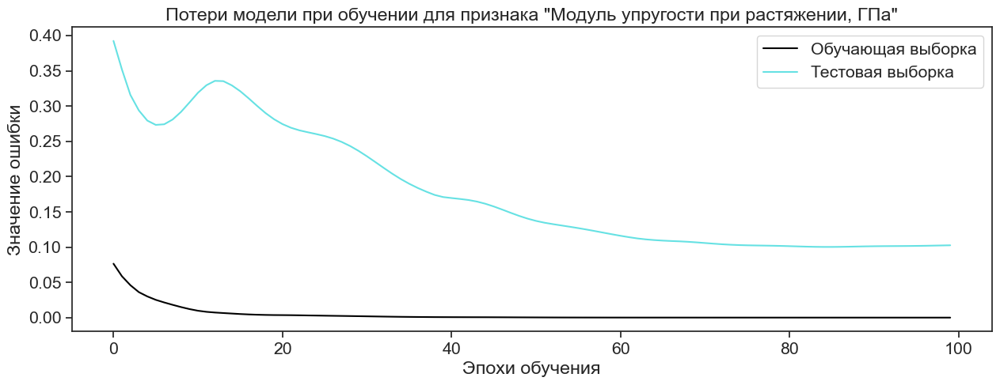

In [78]:
#визуализируем график потерь модели при обучении для первого признака
plt.figure(figsize = (15, 5))
sns.set(font_scale=1.4, style='ticks')
plt.plot(history_upr.history['loss'], color='black')
plt.plot(history_upr.history['val_loss'], color='DarkTurquoise', alpha=0.6)
plt.title('Потери модели при обучении для признака "Модуль упругости при растяжении, ГПа"')
plt.ylabel('Значение ошибки')
plt.xlabel('Эпохи обучения')
plt.legend(['Обучающая выборка', 'Тестовая выборка'])
plt.show()

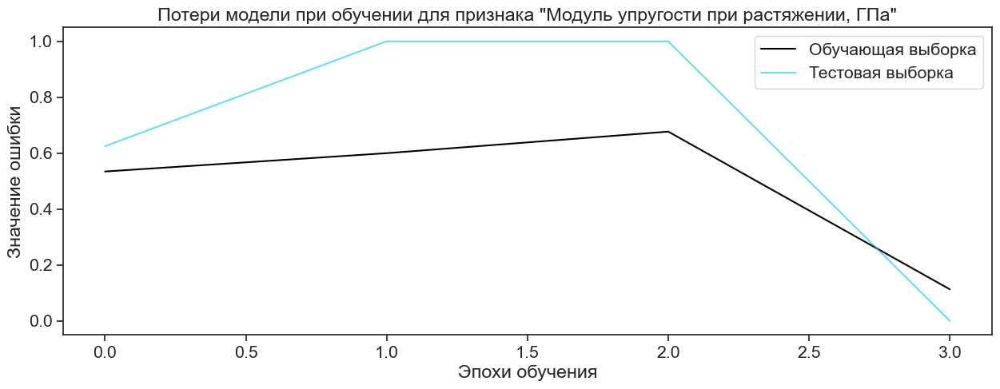

In [79]:
#визуализириуем качество обобщения искусственной нейронной сети на тестовых данных для каждого признака
plt.figure(figsize = (15, 5))
plt.plot(net_pred_upr, label='Прогнозные значения', color='black')
plt.plot(y_test_upr.iloc[:, 0].values, label="Тестовые значения", color='DarkTurquoise', alpha=0.6)
plt.title('Потери модели при обучении для признака "Модуль упругости при растяжении, ГПа"')
plt.ylabel('Значение ошибки')
plt.xlabel('Эпохи обучения')
plt.legend(['Обучающая выборка', 'Тестовая выборка'])
plt.show()

In [80]:
#сравним результаты работу всех 10 моделей, прогнозирующих признак "Модуль упругости при растяжении, ГПа"
df_r2_upr = {'Регрессор':['LinearRegression', 'LCV', 'Ridge', 'ElasticNet', 'RandomForest', 'KNeighbors', 'SVR', 'GradientBoosting', 'DecisionTree', 'Нейросеть'],
                'MAE':[lr_mae_upr, LCV_mae_upr, ridge_mae_upr, elastic_mae_upr, rfr_mae_upr, knn_mae_upr, svr_mae_upr, gb_mae_upr, dtr_mae_upr, net_mae_upr],
                'MSE':[lr_mse_upr, LCV_mae_upr, ridge_mae_upr, elastic_mae_upr, rfr_mae_upr, knn_mae_upr, svr_mae_upr, gb_mae_upr, dtr_mae_upr, net_mse_upr],
                'R2_train':[lr_r2_train_upr, LCV_r2_train_upr, ridge_r2_train_upr, elastic_r2_train_upr, rfr_r2_train_upr, knn_r2_train_upr, svr_r2_train_upr, gb_r2_train_upr, dtr_r2_train_upr, net_r2_train_upr],
                'R2':[lr_r2_upr, LCV_r2_upr, ridge_r2_upr, elastic_r2_upr, rfr_r2_upr, knn_r2_upr, svr_r2_upr, gb_r2_upr, dtr_r2_upr, net_r2_upr]} 
df_r2_upr = pd.DataFrame(df_r2_upr)
df_r2_upr.sort_values(['R2'], ascending=False)

,Регрессор,MAE,MSE,R2_train,R2
0,LinearRegression,2.320366e-14,7.502745e-28,1.000000,1.000000
1,LCV,5.859798e-04,5.859798e-04,0.999999,0.999997
3,ElasticNet,1.416260e-03,1.416260e-03,0.999996,0.999981
2,Ridge,8.952452e-02,8.952452e-02,0.995254,0.924999
4,RandomForest,1.562500e-01,1.562500e-01,0.399428,0.691027
9,Нейросеть,2.316381e-01,7.132285e-02,0.890952,0.572897
5,KNeighbors,1.458333e-01,1.458333e-01,1.000000,0.490578
8,DecisionTree,2.187500e-01,2.187500e-01,0.723247,0.477583
7,GradientBoosting,4.375000e-01,4.375000e-01,0.137417,-0.301832
6,SVR,4.479167e-01,4.479167e-01,-0.007380,-0.343730


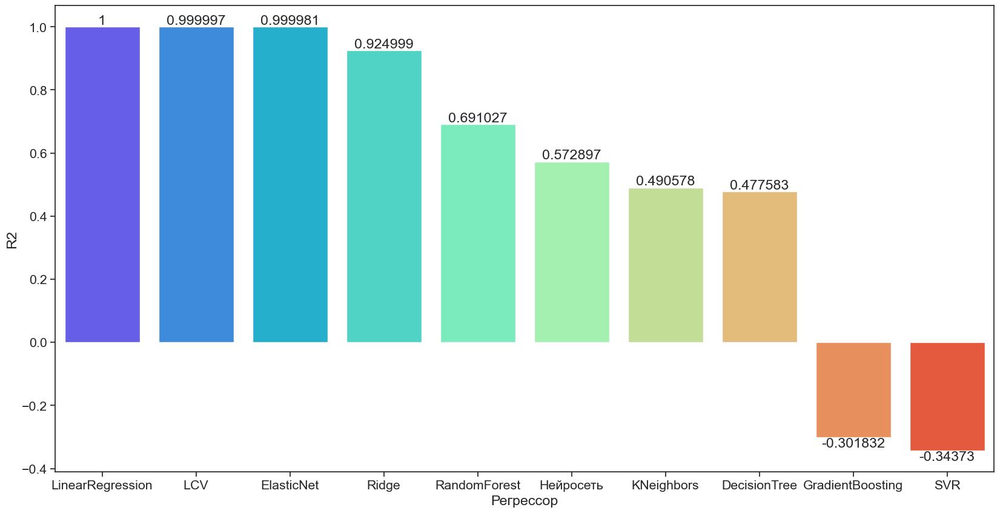

In [81]:
plt.figure(figsize = (20, 10))
ax = sns.barplot(data=df_r2_upr, x=df_r2_upr['Регрессор'], y=df_r2_upr['R2'], palette='rainbow', order=df_r2_upr.sort_values('R2',ascending = False).Регрессор)
for i in ax.containers:
    ax.bar_label(i,)

модель классической линейной регрессии идеально подошла для решения нашей задачи, но так как данных у нас очень мало, то применить модель в реальных условиях практически не получится

создадим банку с методами используемыми в нашей лучшей модели для прогноза upr

In [158]:
#так как данные, которые будут поступать в модель машинного обучения, встроенную в приложение будут являться исходными,
#а модель будет обучена на нормализованных данных, то создадим рабочий поток обработки данных и обучения модели. будем использовать
#метод make_pipeline. в качестве метода преобразования данных будем использовать метод MinMaxScaler() для того чтобы
#автоматически нормализовывать новые данные на входе

#с набором параметров для предсказания признака "Модуль упругости при растяжении, ГПа"
best_model_upr = Pipeline([('preprocessing', MinMaxScaler()), ('regressor', LinearRegression())])
best_model_upr.fit(X_train_upr.values, y_train_upr.iloc[:, 0].values) #обучим банку перед сохранением на диск/добавляем .values для сохранения модели

Pipeline(steps=[('preprocessing', MinMaxScaler()),
                ('regressor', LinearRegression())])

In [167]:
#проверяем работоспособность модели
best_model_upr_before = best_model_upr.predict(X_test_upr)
best_model_upr_before[0]

0.6250000000000059

видим что модель предсказала некое значение, значит она работает

In [186]:
#тестируем формулу которая будет выдавать предсказание денормализованного вида, то есть не трансформированное значение предсказания
best_model_upr_before_out = best_model_upr_before * ((np.max(df_clean['Модуль упругости при растяжении, ГПа'].values) - np.min(df_clean['Модуль упругости при растяжении, ГПа'].values)) + np.min(df_clean['Модуль упругости при растяжении, ГПа'].values))
best_model_upr_before_out[0]

48.75000000000046

In [84]:
#сохраняем модель на диск с помощью модуля pickle
#сохраняем модель предсказывающую признак "Модуль упругости при растяжении, ГПа"
with open('data/flask_app/models/best_model_upr.pkl','wb') as outp:
    pickle.dump(best_model_upr, outp)

In [ ]:
#создаём нормализатор входных значений и сохраняем его
scaler_in_upr = MinMaxScaler().fit(df_clean[df_clean.columns.drop('Модуль упругости при растяжении, ГПа')].values)
with open('data/flask_app/models/scaler_in_upr.pkl','wb') as outp:
    pickle.dump(scaler_in_upr, outp)

In [ ]:
#создаём денормализатор выходных значений, приводим их в собственный масштаб
scaler_out_upr = (np.max(df_clean['Модуль упругости при растяжении, ГПа'].values) - np.min(df_clean['Модуль упругости при растяжении, ГПа'].values)) + np.min(df_clean['Модуль упругости при растяжении, ГПа'].values)
with open('data/flask_app/models/scaler_out_upr.pkl','wb') as outp:
    pickle.dump(scaler_out_upr, outp)

In [85]:
#загружаем модель и проверяем её работоспособность
with open('data/flask_app/models/best_model_upr.pkl', 'rb') as inp:
    best_model_upr = pickle.load(inp)
    
best_model_upr_after = best_model_upr.predict(X_test_upr)

#в данной строке мы проверяем каждое старое прогнозное значение с новым. Функция all возвращает true, если логическая маска
#целиком состоит из значений true. 
print((best_model_upr_before==best_model_upr_after).all())

True


теперь для нейросети

In [86]:
#сохраняем обученную модель
net_upr.save('data/flask_app/models/net_upr')

INFO:tensorflow:Assets written to: data/flask_app/models/net_upr\assets


загружаем сохранённую модель и проверяем ее работоспособность

In [87]:
loaded_net_upr = keras.models.load_model('data/flask_app/models/net_upr')
best_model_upr = net_upr.predict(X_test_upr)
best_model_loaded_upr = loaded_net_upr.predict(X_test_upr)
print((best_model_upr==best_model_loaded_upr).all())

1/1 [==============================] - 0s 47ms/step
True


загружаемая модель работает как и ожидалось, следовательно, она готова к реализации в приложении.

#### **Разделение на обучающую и тестовую выборки для прогноза прочности при растяжении (pr)**

In [88]:
X_pr = df_minmax.drop(['Прочность при растяжении, МПа'], axis=1)
y_pr = df_minmax[['Прочность при растяжении, МПа']]
X_train_pr, X_test_pr, y_train_pr, y_test_pr = train_test_split(X_pr, y_pr, test_size=0.3, random_state=1)

In [89]:
print(X_train_pr.shape, X_test_pr.shape, y_train_pr.shape, y_test_pr.shape)

(9, 11) (4, 11) (9, 1) (4, 1)


##### **Линейная регрессия для pr**

In [90]:
lr.fit(X_train_pr, y_train_pr.iloc[:, 0])
lr_pred_pr = lr.predict(X_test_pr)
lr_mae_pr = mean_absolute_error(lr_pred_pr, y_test_pr)
lr_mse_pr = mean_squared_error(y_test_pr, lr_pred_pr)
lr_r2_train_pr = lr.score(X_train_pr, y_train_pr)
lr_r2_pr = r2_score(y_test_pr, lr_pred_pr)
print('LinearRegression Results')
print(f'mae: {lr_mae_pr.round(3)}')
print(f'mse: {lr_mse_pr.round(3)}')
print(f'R2 на тренировочной выборке: {lr_r2_train_pr.round(3)}')
print(f'R2 на тестовой выборке: {lr_r2_pr.round(3)}')

LinearRegression Results
mae: 0.0
mse: 0.0
R2 на тренировочной выборке: 1.0
R2 на тестовой выборке: 1.0


##### **LASSO-регрессия для pr**

In [91]:
LCV.fit(X_train_pr, y_train_pr.iloc[:, 0])
LCV_pred_pr = LCV.predict(X_test_pr)
LCV_mae_pr = mean_absolute_error(LCV_pred_pr, y_test_pr)
LCV_mse_pr = mean_squared_error(y_test_pr, LCV_pred_pr)
LCV_r2_train_pr = LCV.score(X_train_pr, y_train_pr)
LCV_r2_pr = r2_score(y_test_pr, LCV_pred_pr)
print('LassoCV Results')
print(f'mae: {LCV_mae_pr.round(3)}')
print(f'mse: {LCV_mse_pr.round(3)}')
print(f'R2 на тренировочной выборке: {LCV_r2_train_pr.round(3)}')
print(f'R2 на тестовой выборке: {LCV_r2_pr.round(3)}')

LassoCV Results
mae: 0.001
mse: 0.0
R2 на тренировочной выборке: 1.0
R2 на тестовой выборке: 1.0


##### **Гребневая регрессия для pr**

In [92]:
ridge.fit(X_train_pr, y_train_pr.iloc[:, 0])
ridge_pred_pr = ridge.predict(X_test_pr)
ridge_mae_pr = mean_absolute_error(ridge_pred_pr, y_test_pr)
ridge_mse_pr = mean_squared_error(y_test_pr, ridge_pred_pr)
ridge_r2_train_pr = ridge.score(X_train_pr, y_train_pr)
ridge_r2_pr = r2_score(y_test_pr, ridge_pred_pr)
print('RidgeCV Results')
print(f'mae: {ridge_mae_pr.round(3)}')
print(f'mse: {ridge_mse_pr.round(3)}')
print(f'R2 на тренировочной выборке: {ridge_r2_train_pr.round(3)}')
print(f'R2 на тестовой выборке: {ridge_r2_pr.round(3)}')

RidgeCV Results
mae: 0.123
mse: 0.016
R2 на тренировочной выборке: 0.985
R2 на тестовой выборке: 0.893


##### **ElasticNet регрессия для pr**

In [93]:
elastic.fit(X_train_pr, y_train_pr.iloc[:, 0])
elastic_pred_pr = elastic.predict(X_test_pr)
elastic_mae_pr = mean_absolute_error(elastic_pred_pr, y_test_pr)
elastic_mse_pr = mean_squared_error(y_test_pr, elastic_pred_pr)
elastic_r2_train_pr = elastic.score(X_train_pr, y_train_pr)
elastic_r2_pr = r2_score(y_test_pr, elastic_pred_pr)
print('ElasticNet Results')
print(f'mae: {elastic_mae_pr.round(3)}')
print(f'mse: {elastic_mse_pr.round(3)}')
print(f'R2 на тренировочной выборке: {elastic_r2_train_pr.round(3)}')
print(f'R2 на тестовой выборке: {elastic_r2_pr.round(3)}')

ElasticNet Results
mae: 0.001
mse: 0.0
R2 на тренировочной выборке: 1.0
R2 на тестовой выборке: 1.0


##### **Случайный лес для pr**

In [94]:
rfr_gs_pr = GridSearchCV(RandomForestRegressor(), rfr_param_grid, cv=9, n_jobs=-1, verbose=1)
rfr_gs_pr.fit(X_train_pr, y_train_pr.iloc[:, 0])
print(f"Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {rfr_gs_pr.best_params_}")

Fitting 9 folds for each of 36 candidates, totalling 324 fits
Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {'criterion': 'squared_error', 'max_depth': 1, 'n_estimators': 1}


In [95]:
rfr = RandomForestRegressor(criterion='squared_error', n_estimators=1, max_depth=1, random_state=1)
rfr.fit(X_train_pr, y_train_pr.iloc[:, 0])
rfr_pred_pr = rfr.predict(X_test_pr)
rfr_mae_pr = mean_absolute_error(rfr_pred_pr, y_test_pr)
rfr_mse_pr = mean_squared_error(y_test_pr, rfr_pred_pr)
rfr_r2_train_pr = rfr.score(X_train_pr, y_train_pr)
rfr_r2_pr = r2_score(y_test_pr, rfr_pred_pr)
print('RandomForestRegressor Results')
print(f'mae: {rfr_mae_pr.round(3)}')
print(f'mse: {rfr_mse_pr.round(3)}')
print(f'R2 на тренировочной выборке: {rfr_r2_train_pr.round(3)}')
print(f'R2 на тестовой выборке: {rfr_r2_pr.round(3)}')

RandomForestRegressor Results
mae: 0.132
mse: 0.022
R2 на тренировочной выборке: 0.758
R2 на тестовой выборке: 0.856


##### **k-ближайших соседей для pr**

In [96]:
knn_gs_pr = GridSearchCV(KNeighborsRegressor(), knn_param_grid, cv=9, n_jobs=-1, verbose=1)
knn_gs_pr.fit(X_train_pr, y_train_pr.iloc[:, 0])
print(f"Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {knn_gs_pr.best_params_}")

Fitting 9 folds for each of 30 candidates, totalling 270 fits
Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {'n_neighbors': 1}


In [97]:
knn = KNeighborsRegressor(n_neighbors=1)
knn.fit(X_train_pr, y_train_pr.iloc[:, 0])
knn_pred_pr = knn.predict(X_test_pr)
knn_mae_pr = mean_absolute_error(knn_pred_pr, y_test_pr)
knn_mse_pr = mean_squared_error(y_test_pr, knn_pred_pr)
knn_r2_train_pr = knn.score(X_train_pr, y_train_pr)
knn_r2_pr = r2_score(y_test_pr, knn_pred_pr)
print('KNeighborsRegressor Results')
print(f'mae: {knn_mae_pr.round(3)}')
print(f'mse: {knn_mse_pr.round(3)}')
print(f'R2 на тренировочной выборке: {knn_r2_train_pr.round(3)}')
print(f'R2 на тестовой выборке: {knn_r2_pr.round(3)}')

KNeighborsRegressor Results
mae: 0.0
mse: 0.0
R2 на тренировочной выборке: 1.0
R2 на тестовой выборке: 1.0


##### **Метод опорных векторов (SVR) для pr**

In [98]:
svr_gs_pr = GridSearchCV(SVR(), svr_param_grid, cv=9, n_jobs=-1, verbose=1)
svr_gs_pr.fit(X_train_pr, y_train_pr.iloc[:, 0])
print(f"Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {svr_gs_pr.best_params_}")

Fitting 9 folds for each of 40 candidates, totalling 360 fits
Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {'C': 1e-08, 'kernel': 'linear'}


In [99]:
svr = SVR(C=1e-08, kernel='linear')
svr.fit(X_train_pr, y_train_pr.iloc[:, 0])
svr_pred_pr = svr.predict(X_test_pr)
svr_mae_pr = mean_absolute_error(svr_pred_pr, y_test_pr)
svr_mse_pr = mean_squared_error(y_test_pr, svr_pred_pr)
svr_r2_train_pr = svr.score(X_train_pr, y_train_pr)
svr_r2_pr = r2_score(y_test_pr, svr_pred_pr)
print('SVR Results')
print(f'mae: {svr_mae_pr.round(3)}')
print(f'mse: {svr_mse_pr.round(3)}')
print(f'R2 на тренировочной выборке: {svr_r2_train_pr.round(3)}')
print(f'R2 на тестовой выборке: {svr_r2_pr.round(3)}')

SVR Results
mae: 0.44
mse: 0.198
R2 на тренировочной выборке: -0.001
R2 на тестовой выборке: -0.297


##### **Градиентный бустинг (GradientBoosting) для pr**

In [100]:
gb_gs_pr = GridSearchCV(GradientBoostingRegressor(), gb_param_grid, cv=9, n_jobs=-1, verbose=1)
gb_gs_pr.fit(X_train_pr, y_train_pr.iloc[:, 0])
print(f"Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {gb_gs_pr.best_params_}")

Fitting 9 folds for each of 320 candidates, totalling 2880 fits
Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {'loss': 'squared_error', 'max_depth': 1, 'max_features': 1, 'n_estimators': 1}


In [101]:
gb = GradientBoostingRegressor(loss='squared_error', max_depth=1, max_features=1, n_estimators=1)
gb.fit(X_train_pr, y_train_pr.iloc[:, 0])
gb_pred_pr = gb.predict(X_test_pr)
gb_mae_pr = mean_absolute_error(gb_pred_pr, y_test_pr)
gb_mse_pr = mean_squared_error(y_test_pr, gb_pred_pr)
gb_r2_train_pr = gb.score(X_train_pr, y_train_pr)
gb_r2_pr = r2_score(y_test_pr, gb_pred_pr)
print('GradientBoostingRegressor Results')
print(f'mae: {gb_mae_pr.round(3)}')
print(f'mse: {gb_mse_pr.round(3)}')
print(f'R2 на тренировочной выборке: {gb_r2_train_pr.round(3)}')
print(f'R2 на тестовой выборке: {gb_r2_pr.round(3)}')

GradientBoostingRegressor Results
mae: 0.424
mse: 0.182
R2 на тренировочной выборке: 0.103
R2 на тестовой выборке: -0.189


##### **Дерево решений (DecisionTreeRegressor) для pr**

In [102]:
dtr_gs_pr = GridSearchCV(DecisionTreeRegressor(), dtr_param_grid, cv=9, n_jobs=-1, verbose=1)
dtr_gs_pr.fit(X_train_pr, y_train_pr.iloc[:, 0])
print(f"Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {dtr_gs_pr.best_params_}")

Fitting 9 folds for each of 896 candidates, totalling 8064 fits
Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {'criterion': 'squared_error', 'max_depth': 1, 'max_features': 1, 'splitter': 'best'}


In [103]:
dtr = DecisionTreeRegressor(criterion='squared_error', max_depth=1, max_features=1, splitter='best')
dtr.fit(X_train_pr, y_train_pr.iloc[:, 0])
dtr_pred_pr = dtr.predict(X_test_pr)
dtr_mae_pr = mean_absolute_error(dtr_pred_pr, y_test_pr)
dtr_mse_pr = mean_squared_error(y_test_pr, dtr_pred_pr)
dtr_r2_train_pr = dtr.score(X_train_pr, y_train_pr)
dtr_r2_pr = r2_score(y_test_pr, dtr_pred_pr)
print('DecisionTreeRegressor Results')
print(f'mae: {dtr_mae_pr.round(3)}')
print(f'mse: {dtr_mse_pr.round(3)}')
print(f'R2 на тренировочной выборке: {dtr_r2_train_pr.round(3)}')
print(f'R2 на тестовой выборке: {dtr_r2_pr.round(3)}')

DecisionTreeRegressor Results
mae: 0.667
mse: 0.492
R2 на тренировочной выборке: 0.72
R2 на тестовой выборке: -2.221


#### **Создаём нейронную сеть для прогноза pr**

In [104]:
net_pr = Sequential()
net_pr.add(Dense(128, input_dim=X_train_pr.shape[1], activation='relu'))
net_pr.add(Dense(8, activation='relu'))
net_pr.add(Dense(8, activation='relu'))
net_pr.add(Dense(1, activation='linear')) #выходной слой с одним линейным нейроном для решения задачи регрессии

In [105]:
print(net_pr.summary()) #архитектура нашей модели

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 128)               1536      
                                                                 
 dense_5 (Dense)             (None, 8)                 1032      
                                                                 
 dense_6 (Dense)             (None, 8)                 72        
                                                                 
 dense_7 (Dense)             (None, 1)                 9         
                                                                 
Total params: 2,649
Trainable params: 2,649
Non-trainable params: 0
_________________________________________________________________
None


In [106]:
#компилируем ИНС. в качестве функции потерь будем использовать Mean-Squared-Error(MSE) - среднюю квадратичную ошибку
#метрикой будет Mean-Absolute-Error(MAE) - средний модуль ошибки
net_pr.compile(optimizer=Adam(0.001), loss='mse', metrics=['mae'])

In [107]:
#обучаем модель для предсказания признака "Прочность при растяжении, МПа"
history_pr = net_pr.fit(X_train_pr, y_train_pr.iloc[:, 0], epochs=100, validation_split=0.1, verbose=1)
#рассчитаем коэффицент детерминации искуственной нейронной сети для признака "Прочность при растяжении, МПа"
print(f'Коэффициент детерминации для признака "{y_train_pr.columns[0]}": {r2_score(y_test_pr.iloc[:, 0], (net_pr.predict(X_test_pr)))}')

Epoch 1/100
1/1 [==============================] - 0s 391ms/step - loss: 0.4465 - mae: 0.5934 - val_loss: 0.0018 - val_mae: 0.0427
Epoch 2/100
1/1 [==============================] - 0s 27ms/step - loss: 0.4109 - mae: 0.5691 - val_loss: 0.0107 - val_mae: 0.1036
Epoch 3/100
1/1 [==============================] - 0s 26ms/step - loss: 0.3786 - mae: 0.5453 - val_loss: 0.0263 - val_mae: 0.1621
Epoch 4/100
1/1 [==============================] - 0s 26ms/step - loss: 0.3489 - mae: 0.5198 - val_loss: 0.0446 - val_mae: 0.2112
Epoch 5/100
1/1 [==============================] - 0s 26ms/step - loss: 0.3274 - mae: 0.4981 - val_loss: 0.0638 - val_mae: 0.2527
Epoch 6/100
1/1 [==============================] - 0s 26ms/step - loss: 0.3097 - mae: 0.4785 - val_loss: 0.0833 - val_mae: 0.2886
Epoch 7/100
1/1 [==============================] - 0s 26ms/step - loss: 0.2928 - mae: 0.4588 - val_loss: 0.1024 - val_mae: 0.3200
Epoch 8/100
1/1 [==============================] - 0s 26ms/step - loss: 0.2763 - mae: 0.4

In [108]:
net_pred_pr = net_pr.predict(X_test_pr)
net_mae_pr = mean_absolute_error(net_pred_pr, y_test_pr)
net_mse_pr = mean_squared_error(y_test_pr, net_pred_pr)
net_r2_train_pr = r2_score(y_train_pr, net_pr.predict(X_train_pr))
net_r2_pr = r2_score(y_test_pr, net_pred_pr)
print('net Results')
print(f'mae: {net_mae_pr.round(3)}')
print(f'mse: {net_mse_pr.round(3)}')
print(f'R2 на тренировочной выборке: {net_r2_train_pr.round(3)}')
print(f'R2 на тестовой выборке: {net_r2_pr.round(3)}')

1/1 [==============================] - 0s 17ms/step
net Results
mae: 0.59
mse: 0.445
R2 на тренировочной выборке: 0.721
R2 на тестовой выборке: -1.912


#### **Визуализация метрик для pr**

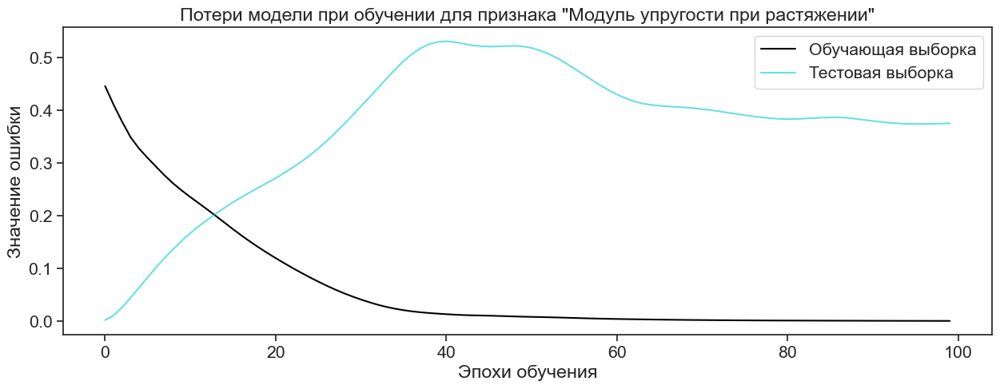

In [109]:
plt.figure(figsize = (15, 5))
sns.set(font_scale=1.4, style='ticks')
plt.plot(history_pr.history['loss'], color='black')
plt.plot(history_pr.history['val_loss'], color='DarkTurquoise', alpha=0.6)
plt.title('Потери модели при обучении для признака "Модуль упругости при растяжении"')
plt.ylabel('Значение ошибки')
plt.xlabel('Эпохи обучения')
plt.legend(['Обучающая выборка', 'Тестовая выборка'])
plt.show()

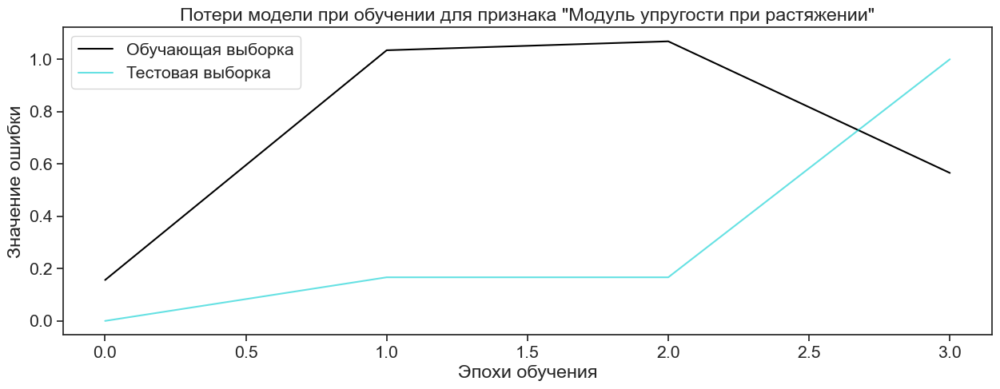

In [110]:
plt.figure(figsize = (15, 5))
plt.plot(net_pred_pr, label='Прогнозные значения', color='black')
plt.plot(y_test_pr.iloc[:, 0].values, label="Тестовые значения", color='DarkTurquoise', alpha=0.6)
plt.title('Потери модели при обучении для признака "Модуль упругости при растяжении"')
plt.ylabel('Значение ошибки')
plt.xlabel('Эпохи обучения')
plt.legend(['Обучающая выборка', 'Тестовая выборка'])
plt.show()

In [111]:
#сравним результаты работ всех 10 моделей, прогнозирующих признак "Прочность при растяжении, МПа"
df_r2_pr = {'Регрессор':['LinearRegression', 'LCV', 'Ridge', 'ElasticNet', 'RandomForest', 'KNeighbors', 'SVR', 'GradientBoosting', 'DecisionTree', 'Нейросеть'],
                'MAE':[lr_mae_pr, LCV_mae_pr, ridge_mae_pr, elastic_mae_pr, rfr_mae_pr, knn_mae_pr, svr_mae_pr, gb_mae_pr, dtr_mae_pr, net_mae_pr],
                'MSE':[lr_mse_pr, LCV_mae_pr, ridge_mae_pr, elastic_mae_pr, rfr_mae_pr, knn_mae_pr, svr_mae_pr, gb_mae_pr, dtr_mae_pr, net_mse_pr],
                'R2_train':[lr_r2_train_pr, LCV_r2_train_pr, ridge_r2_train_pr, elastic_r2_train_pr, rfr_r2_train_pr, knn_r2_train_pr, svr_r2_train_pr, gb_r2_train_pr, dtr_r2_train_pr, net_r2_train_pr],
                'R2':[lr_r2_pr, LCV_r2_pr, ridge_r2_pr, elastic_r2_pr, rfr_r2_pr, knn_r2_pr, svr_r2_pr, gb_r2_pr, dtr_r2_pr, net_r2_pr]} 
df_r2_pr = pd.DataFrame(df_r2_pr)
df_r2_pr.sort_values(['R2'], ascending=False)

,Регрессор,MAE,MSE,R2_train,R2
0,LinearRegression,2.843559e-14,1.129720e-27,1.000000,1.000000
5,KNeighbors,0.000000e+00,0.000000e+00,1.000000,1.000000
1,LCV,5.085082e-04,5.085082e-04,0.999998,0.999997
3,ElasticNet,1.433480e-03,1.433480e-03,0.999991,0.999976
2,Ridge,1.232409e-01,1.232409e-01,0.984599,0.892769
4,RandomForest,1.317130e-01,1.317130e-01,0.757752,0.855790
7,GradientBoosting,4.241071e-01,4.241071e-01,0.102635,-0.189345
6,SVR,4.398148e-01,4.398148e-01,-0.001011,-0.296857
9,Нейросеть,5.900883e-01,4.448766e-01,0.721307,-1.911919
8,DecisionTree,6.666667e-01,6.666667e-01,0.720183,-2.220609


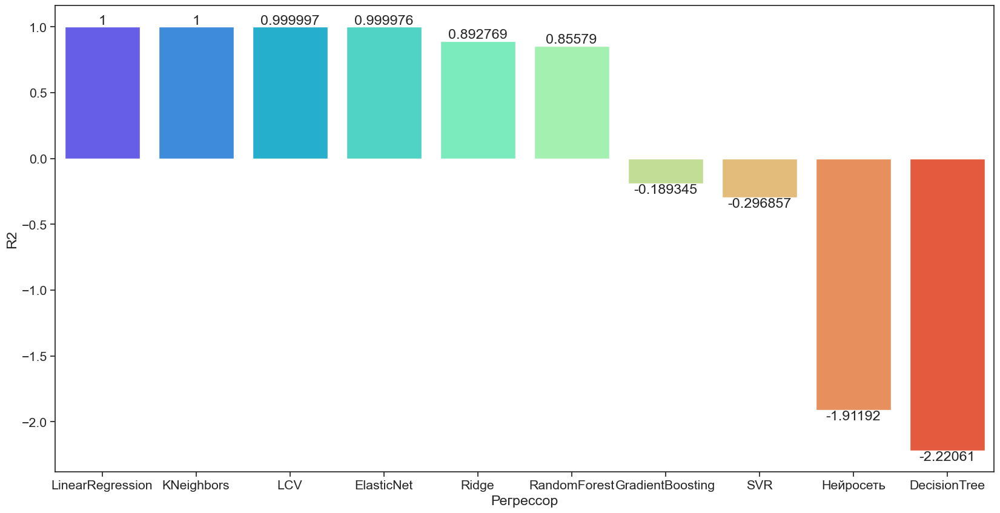

In [112]:
plt.figure(figsize = (20, 10))
ax = sns.barplot(data=df_r2_pr, x=df_r2_pr['Регрессор'], y=df_r2_pr['R2'], palette='rainbow', order=df_r2_pr.sort_values('R2',ascending = False).Регрессор)
for i in ax.containers:
    ax.bar_label(i,)

модель классической линейной регрессии идеально подошла для решения нашей задачи, но так как данных у нас очень мало, то применить модель в реальных условиях практически не получится

создадим банку с нашей лучшей моделью для прогноза pr

In [113]:
best_model_pr = Pipeline([('preprocessing', MinMaxScaler()), ('regressor', LinearRegression())])
best_model_pr.fit(X_train_pr.values, y_train_pr.iloc[:, 0].values) #добавляем .values для сохранения модели

Pipeline(steps=[('preprocessing', MinMaxScaler()),
                ('regressor', LinearRegression())])

In [114]:
#проверяем работоспособность модели
best_model_pr_before = best_model_pr.predict(X_test_pr)
best_model_pr_before[0]

7.438494264988549e-15

видим что модель предсказала некое значение, значит она работает

In [193]:
#тестируем формулу которая будет выдавать предсказание денормализованного вида, то есть не трансформированное значение предсказания
best_model_pr_before_out = best_model_pr_before * ((np.max(df_clean['Прочность при растяжении, МПа'].values) - np.min(df_clean['Прочность при растяжении, МПа'].values)) + np.min(df_clean['Прочность при растяжении, МПа'].values))
best_model_pr_before_out[0]

2.2315482794965646e-11

In [115]:
#сохраняем модель предсказывающую признак "Прочность при растяжении, МПа"
with open('data/flask_app/models/best_model_pr.pkl','wb') as outp:
    pickle.dump(best_model_pr, outp)

In [194]:
#создаём нормализатор входных значений и сохраняем его
scaler_in_pr = MinMaxScaler().fit(df_clean[df_clean.columns.drop('Прочность при растяжении, МПа')].values)
with open('data/flask_app/models/scaler_in_pr.pkl','wb') as outp:
    pickle.dump(scaler_in_pr, outp)

In [195]:
#создаём денормализатор выходных значений, приводим их в собственный масштаб
scaler_out_pr = (np.max(df_clean['Прочность при растяжении, МПа'].values) - np.min(df_clean['Прочность при растяжении, МПа'].values)) + np.min(df_clean['Прочность при растяжении, МПа'].values)
with open('data/flask_app/models/scaler_out_pr.pkl','wb') as outp:
    pickle.dump(scaler_out_pr, outp)

In [116]:
#загружаем модель и проверяем её работоспособность
with open('data/flask_app/models/best_model_pr.pkl', 'rb') as inp:
    best_model_pr = pickle.load(inp)
    
best_model_pr_after = best_model_pr.predict(X_test_pr)
#проверяем каждое старое прогнозное значение с новым. Функция all возвращает true, если логическая маска
#целиком состоит из значений true. 
print((best_model_pr_before==best_model_pr_after).all())

True


теперь для нейросети

In [117]:
#сохраняем обученную модель
net_pr.save('data/flask_app/models/net_pr')

INFO:tensorflow:Assets written to: data/flask_app/models/net_pr\assets


загружаем сохранённую модель и проверяем ее работоспособность

In [118]:
loaded_net_pr = keras.models.load_model('data/flask_app/models/net_pr')
best_model_pr = net_pr.predict(X_test_pr)
best_model_loaded_pr = loaded_net_pr.predict(X_test_pr)
print((best_model_pr==best_model_loaded_pr).all())

1/1 [==============================] - 0s 46ms/step
True


загружаемая модель работает как и ожидалось, следовательно, она готова к реализации в приложении.

#### **Разбиение на обучающую и тестовую выборки для прогноза соотношения матрица-наполнитель (mn)**

In [119]:
X_mn = df_minmax.drop(['Соотношение матрица-наполнитель'], axis=1)
y_mn = df_minmax[['Соотношение матрица-наполнитель']]
X_train_mn, X_test_mn, y_train_mn, y_test_mn = train_test_split(X_mn, y_mn, test_size=0.3, random_state=1)

In [120]:
print(X_train_mn.shape, X_test_mn.shape, y_train_mn.shape, y_test_mn.shape)

(9, 11) (4, 11) (9, 1) (4, 1)


In [121]:
y_train_mn.shape[1]

1

##### **Линейная регрессия для mn**

In [122]:
lr.fit(X_train_mn, y_train_mn.iloc[:, 0])
lr_pred_mn = lr.predict(X_test_mn)
lr_mae_mn = mean_absolute_error(lr_pred_mn, y_test_mn)
lr_mse_mn = mean_squared_error(y_test_mn, lr_pred_mn)
lr_r2_train_mn = lr.score(X_train_mn, y_train_mn)
lr_r2_mn = r2_score(y_test_mn, lr_pred_mn)
print('LinearRegression Results')
print(f'mae: {lr_mae_mn.round(3)}')
print(f'mse: {lr_mse_mn.round(3)}')
print(f'R2 на тренировочной выборке: {lr_r2_train_mn.round(3)}')
print(f'R2 на тестовой выборке: {lr_r2_mn.round(3)}')

LinearRegression Results
mae: 1.855
mse: 4.748
R2 на тренировочной выборке: 1.0
R2 на тестовой выборке: -694.652


##### **LASSO-регрессия для mn**

In [123]:
LCV.fit(X_train_mn, y_train_mn.iloc[:, 0])
LCV_pred_mn = LCV.predict(X_test_mn)
LCV_mae_mn = mean_absolute_error(LCV_pred_mn, y_test_mn)
LCV_mse_mn = mean_squared_error(y_test_mn, LCV_pred_mn)
LCV_r2_train_mn = LCV.score(X_train_mn, y_train_mn)
LCV_r2_mn = r2_score(y_test_mn, LCV_pred_mn)
print('LassoCV Results')
print(f'mae: {LCV_mae_mn.round(3)}')
print(f'mse: {LCV_mse_mn.round(3)}')
print(f'R2 на тренировочной выборке: {LCV_r2_train_mn.round(3)}')
print(f'R2 на тестовой выборке: {LCV_r2_mn.round(3)}')

LassoCV Results
mae: 0.139
mse: 0.023
R2 на тренировочной выборке: 0.662
R2 на тестовой выборке: -2.433


##### **Гребневая регрессия для mn**

In [124]:
ridge.fit(X_train_mn, y_train_mn.iloc[:, 0])
ridge_pred_mn = ridge.predict(X_test_mn)
ridge_mae_mn = mean_absolute_error(ridge_pred_mn, y_test_mn)
ridge_mse_mn = mean_squared_error(y_test_mn, ridge_pred_mn)
ridge_r2_train_mn = ridge.score(X_train_mn, y_train_mn)
ridge_r2_mn = r2_score(y_test_mn, ridge_pred_mn)
print('RidgeCV Results')
print(f'mae: {ridge_mae_mn.round(3)}')
print(f'mse: {ridge_mse_mn.round(3)}')
print(f'R2 на тренировочной выборке: {ridge_r2_train_mn.round(3)}')
print(f'R2 на тестовой выборке: {ridge_r2_mn.round(3)}')

RidgeCV Results
mae: 0.117
mse: 0.02
R2 на тренировочной выборке: 0.689
R2 на тестовой выборке: -1.92


##### **ElasticNet регрессия для mn**

In [125]:
elastic.fit(X_train_mn, y_train_mn.iloc[:, 0])
elastic_pred_mn = elastic.predict(X_test_mn)
elastic_mae_mn = mean_absolute_error(elastic_pred_mn, y_test_mn)
elastic_mse_mn = mean_squared_error(y_test_mn, elastic_pred_mn)
elastic_r2_train_mn = elastic.score(X_train_mn, y_train_mn)
elastic_r2_mn = r2_score(y_test_mn, elastic_pred_mn)
print('ElasticNet Results')
print(f'mae: {elastic_mae_mn.round(3)}')
print(f'mse: {elastic_mse_mn.round(3)}')
print(f'R2 на тренировочной выборке: {elastic_r2_train_mn.round(3)}')
print(f'R2 на тестовой выборке: {elastic_r2_mn.round(3)}')

ElasticNet Results
mae: 0.134
mse: 0.022
R2 на тренировочной выборке: 0.672
R2 на тестовой выборке: -2.279


##### **Случайный лес для mn**

In [126]:
rfr_gs_mn = GridSearchCV(RandomForestRegressor(), rfr_param_grid, cv=9, n_jobs=-1, verbose=1)
rfr_gs_mn.fit(X_train_mn, y_train_mn.iloc[:, 0])
print(f"Лучшие параметры для предсказания признака 'Соотношение матрица-наполнитель' {rfr_gs_mn.best_params_}")

Fitting 9 folds for each of 36 candidates, totalling 324 fits
Лучшие параметры для предсказания признака 'Соотношение матрица-наполнитель' {'criterion': 'squared_error', 'max_depth': 1, 'n_estimators': 1}


In [127]:
rfr = RandomForestRegressor(criterion='squared_error', n_estimators=1, max_depth=1)
rfr.fit(X_train_mn, y_train_mn.iloc[:, 0])
rfr_pred_mn = rfr.predict(X_test_mn)
rfr_mae_mn = mean_absolute_error(rfr_pred_mn, y_test_mn)
rfr_mse_mn = mean_squared_error(y_test_mn, rfr_pred_mn)
rfr_r2_train_mn = rfr.score(X_train_mn, y_train_mn)
rfr_r2_mn = r2_score(y_test_mn, rfr_pred_mn)
print('RandomForestRegressor Results')
print(f'mae: {rfr_mae_mn.round(3)}')
print(f'mse: {rfr_mse_mn.round(3)}')
print(f'R2 на тренировочной выборке: {rfr_r2_train_mn.round(3)}')
print(f'R2 на тестовой выборке: {rfr_r2_mn.round(3)}')

RandomForestRegressor Results
mae: 0.381
mse: 0.165
R2 на тренировочной выборке: 0.611
R2 на тестовой выборке: -23.11


##### **k-ближайших соседей для mn**

In [128]:
knn_gs_mn = GridSearchCV(KNeighborsRegressor(), knn_param_grid, cv=9, n_jobs=-1, verbose=1)
knn_gs_mn.fit(X_train_mn, y_train_mn.iloc[:, 0])
print(f"Лучшие параметры для предсказания признака 'Соотношение матрица-наполнитель' {knn_gs_mn.best_params_}")

Fitting 9 folds for each of 30 candidates, totalling 270 fits
Лучшие параметры для предсказания признака 'Соотношение матрица-наполнитель' {'n_neighbors': 1}


In [129]:
knn = KNeighborsRegressor(n_neighbors=1)
knn.fit(X_train_mn, y_train_mn.iloc[:, 0])
knn_pred_mn = knn.predict(X_test_mn)
knn_mae_mn = mean_absolute_error(knn_pred_mn, y_test_mn)
knn_mse_mn = mean_squared_error(y_test_mn, knn_pred_mn)
knn_r2_train_mn = knn.score(X_train_mn, y_train_mn)
knn_r2_mn = r2_score(y_test_mn, knn_pred_mn)
print('KNeighborsRegressor Results')
print(f'mae: {knn_mae_mn.round(3)}')
print(f'mse: {knn_mse_mn.round(3)}')
print(f'R2 на тренировочной выборке: {knn_r2_train_mn.round(3)}')
print(f'R2 на тестовой выборке: {knn_r2_mn.round(3)}')

KNeighborsRegressor Results
mae: 0.148
mse: 0.028
R2 на тренировочной выборке: 1.0
R2 на тестовой выборке: -3.115


##### **Метод опорных векторов (SVR) для mn**

In [130]:
svr_gs_mn = GridSearchCV(SVR(), svr_param_grid, cv=9, n_jobs=-1, verbose=1)
svr_gs_mn.fit(X_train_mn, y_train_mn.iloc[:, 0])
print(f"Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {svr_gs_mn.best_params_}")

Fitting 9 folds for each of 40 candidates, totalling 360 fits
Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {'C': 1e-08, 'kernel': 'linear'}


In [131]:
svr = SVR(C=1e-08, kernel='linear')
svr.fit(X_train_mn, y_train_mn.iloc[:, 0])
svr_pred_mn = svr.predict(X_test_mn)
svr_mae_mn = mean_absolute_error(svr_pred_mn, y_test_mn)
svr_mse_mn = mean_squared_error(y_test_mn, svr_pred_mn)
svr_r2_train_mn = svr.score(X_train_mn, y_train_mn)
svr_r2_mn = r2_score(y_test_mn, svr_pred_mn)
print('SVR Results')
print(f'mae: {svr_mae_mn.round(3)}')
print(f'mse: {svr_mse_mn.round(3)}')
print(f'R2 на тренировочной выборке: {svr_r2_train_mn.round(3)}')
print(f'R2 на тестовой выборке: {svr_r2_mn.round(3)}')

SVR Results
mae: 0.147
mse: 0.028
R2 на тренировочной выборке: -0.011
R2 на тестовой выборке: -3.171


##### **Градиентный бустинг (GradientBoosting) для mn**

In [132]:
gb_gs_mn = GridSearchCV(GradientBoostingRegressor(), gb_param_grid, cv=9, n_jobs=-1, verbose=1)
gb_gs_mn.fit(X_train_mn, y_train_mn.iloc[:, 0])
print(f"Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {gb_gs_mn.best_params_}")

Fitting 9 folds for each of 320 candidates, totalling 2880 fits
Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {'loss': 'squared_error', 'max_depth': 1, 'max_features': 1, 'n_estimators': 1}


In [133]:
gb = GradientBoostingRegressor(loss='squared_error', max_depth=1, max_features=1, n_estimators=1)
gb.fit(X_train_mn, y_train_mn.iloc[:, 0])
gb_pred_mn = gb.predict(X_test_mn)
gb_mae_mn = mean_absolute_error(gb_pred_mn, y_test_mn)
gb_mse_mn = mean_squared_error(y_test_mn, gb_pred_mn)
gb_r2_train_mn = gb.score(X_train_mn, y_train_mn)
gb_r2_mn = r2_score(y_test_mn, gb_pred_mn)
print('GradientBoostingRegressor Results')
print(f'mae: {gb_mae_mn.round(3)}')
print(f'mse: {gb_mse_mn.round(3)}')
print(f'R2 на тренировочной выборке: {gb_r2_train_mn.round(3)}')
print(f'R2 на тестовой выборке: {gb_r2_mn.round(3)}')

GradientBoostingRegressor Results
mae: 0.12
mse: 0.018
R2 на тренировочной выборке: 0.107
R2 на тестовой выборке: -1.698


##### **Дерево решений (DecisionTreeRegressor) для mn**

In [134]:
dtr_gs_mn = GridSearchCV(DecisionTreeRegressor(), dtr_param_grid, cv=9, n_jobs=-1, verbose=1)
dtr_gs_mn.fit(X_train_mn, y_train_mn.iloc[:, 0])
print(f"Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {dtr_gs_mn.best_params_}")

Fitting 9 folds for each of 896 candidates, totalling 8064 fits
Лучшие параметры для предсказания признака 'Прочность при растяжении, МПа' {'criterion': 'squared_error', 'max_depth': 1, 'max_features': 1, 'splitter': 'best'}


In [135]:
dtr = DecisionTreeRegressor(criterion='squared_error', max_depth=1, max_features=1, splitter='best')
dtr.fit(X_train_mn, y_train_mn.iloc[:, 0])
dtr_pred_mn = dtr.predict(X_test_mn)
dtr_mae_mn = mean_absolute_error(dtr_pred_mn, y_test_mn)
dtr_mse_mn = mean_squared_error(y_test_mn, dtr_pred_mn)
dtr_r2_train_mn = dtr.score(X_train_mn, y_train_mn)
dtr_r2_mn = r2_score(y_test_mn, dtr_pred_mn)
print('DecisionTreeRegressor Results')
print(f'mae: {dtr_mae_mn.round(3)}')
print(f'mse: {dtr_mse_mn.round(3)}')
print(f'R2 на тренировочной выборке: {dtr_r2_train_mn.round(3)}')
print(f'R2 на тестовой выборке: {dtr_r2_mn.round(3)}')

DecisionTreeRegressor Results
mae: 0.219
mse: 0.056
R2 на тренировочной выборке: 0.413
R2 на тестовой выборке: -7.239


#### **Создаём нейронную сеть для прогноза mn**

In [136]:
net_mn = Sequential()
net_mn.add(Dense(128, input_dim=X_train_mn.shape[1], activation='relu'))
net_mn.add(Dense(8, activation='relu'))
net_mn.add(Dense(8, activation='relu'))
net_mn.add(Dense(1, activation='linear')) #выходной слой с одним линейным нейроном для решения задачи регресси

In [137]:
print(net_mn.summary()) #архитектура нашей модели

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 128)               1536      
                                                                 
 dense_9 (Dense)             (None, 8)                 1032      
                                                                 
 dense_10 (Dense)            (None, 8)                 72        
                                                                 
 dense_11 (Dense)            (None, 1)                 9         
                                                                 
Total params: 2,649
Trainable params: 2,649
Non-trainable params: 0
_________________________________________________________________
None


In [138]:
net_mn.compile(optimizer=Adam(0.001), loss='mse', metrics=['mae'])

In [139]:
#обучаем модель для предсказания признака "Соотношение матрица-наполнитель"
history_mn = net_mn.fit(X_train_mn, y_train_mn.iloc[:, 0], epochs=100, validation_split=0.1, verbose=1)
#рассчитаем коэффицент детерминации искуственной нейронной сети для признака "Соотношение матрица-наполнитель"
print(f'Коэффициент детерминации для признака "{y_train_mn.columns[0]}": {r2_score(y_test_mn.iloc[:, 0], (net_mn.predict(X_test_mn)))}')

Epoch 1/100
1/1 [==============================] - 0s 391ms/step - loss: 0.1788 - mae: 0.3473 - val_loss: 0.0643 - val_mae: 0.2536
Epoch 2/100
1/1 [==============================] - 0s 26ms/step - loss: 0.1539 - mae: 0.3219 - val_loss: 0.0394 - val_mae: 0.1986
Epoch 3/100
1/1 [==============================] - 0s 25ms/step - loss: 0.1375 - mae: 0.3011 - val_loss: 0.0237 - val_mae: 0.1539
Epoch 4/100
1/1 [==============================] - 0s 26ms/step - loss: 0.1245 - mae: 0.2854 - val_loss: 0.0136 - val_mae: 0.1167
Epoch 5/100
1/1 [==============================] - 0s 26ms/step - loss: 0.1130 - mae: 0.2751 - val_loss: 0.0074 - val_mae: 0.0862
Epoch 6/100
1/1 [==============================] - 0s 26ms/step - loss: 0.1030 - mae: 0.2656 - val_loss: 0.0038 - val_mae: 0.0619
Epoch 7/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0948 - mae: 0.2553 - val_loss: 0.0017 - val_mae: 0.0417
Epoch 8/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0884 - mae: 0.2

In [140]:
net_pred_mn = net_mn.predict(X_test_mn)
net_mae_mn = mean_absolute_error(net_pred_mn, y_test_mn)
net_mse_mn = mean_squared_error(y_test_mn, net_pred_mn)
net_r2_train_mn = r2_score(y_train_mn, net_mn.predict(X_train_mn))
net_r2_mn = r2_score(y_test_mn, net_pred_mn)
print('net Results')
print(f'mae: {net_mae_mn.round(3)}')
print(f'mse: {net_mse_mn.round(3)}')
print(f'R2 на тренировочной выборке: {net_r2_train_mn.round(3)}')
print(f'R2 на тестовой выборке: {net_r2_mn.round(3)}')

1/1 [==============================] - 0s 16ms/step
net Results
mae: 0.326
mse: 0.189
R2 на тренировочной выборке: 0.468
R2 на тестовой выборке: -26.626


#### **Визуализация метрик для upr**

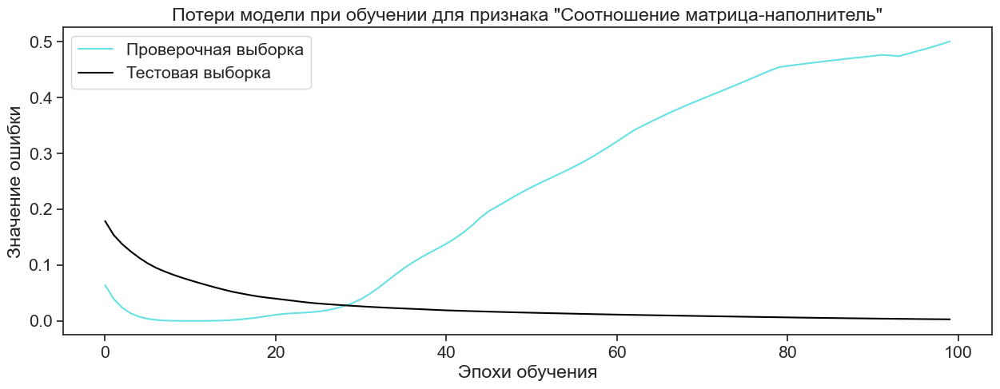

In [141]:
#визуализируем график потерь модели при обучении
plt.figure(figsize = (15, 5))
sns.set(font_scale=1.4, style='ticks')
plt.plot(history_mn.history['val_loss'], color='DarkTurquoise', alpha=0.6)
plt.plot(history_mn.history['loss'], color='black')
plt.title('Потери модели при обучении для признака "Соотношение матрица-наполнитель"')
plt.ylabel('Значение ошибки')
plt.xlabel('Эпохи обучения')
plt.legend(['Проверочная выборка', 'Тестовая выборка'])
plt.show()

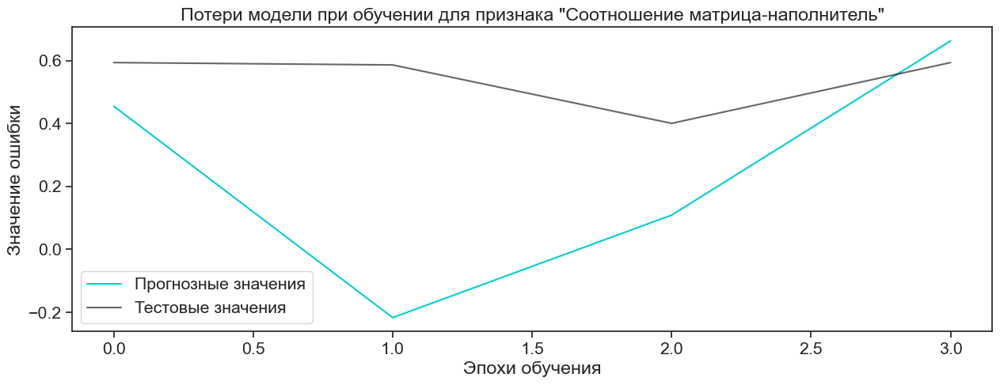

In [142]:
#визуализириуем качество обобщения искусственной нейронной сети на тестовых данных
plt.figure(figsize = (15, 5))
plt.plot(net_pred_mn, label='Прогнозные значения', color='DarkTurquoise')
plt.plot(y_test_mn.iloc[:, 0].values, label='Тестовые значения',  alpha=0.6, color='black')
plt.title('Потери модели при обучении для признака "Соотношение матрица-наполнитель"')
plt.ylabel('Значение ошибки')
plt.xlabel('Эпохи обучения')
plt.legend(['Прогнозные значения', 'Тестовые значения'])
plt.show()

In [143]:
#сравним результаты работы всех 10 моделей, прогнозирующих признак "Соотношение матрица-наполнитель"
df_r2_mn = {'Регрессор':['LinearRegression', 'LCV', 'Ridge', 'ElasticNet', 'RandomForest', 'KNeighbors', 'SVR', 'GradientBoosting', 'DecisionTree', 'Нейросеть'],
                'MAE':[lr_mae_mn, LCV_mae_mn, ridge_mae_mn, elastic_mae_mn, rfr_mae_mn, knn_mae_mn, svr_mae_mn, gb_mae_mn, dtr_mae_mn, net_mae_mn],
                'MSE':[lr_mse_mn, LCV_mae_mn, ridge_mae_mn, elastic_mae_mn, rfr_mae_mn, knn_mae_mn, svr_mae_mn, gb_mae_mn, dtr_mae_mn, net_mse_mn],
                'R2_train':[lr_r2_train_mn, LCV_r2_train_mn, ridge_r2_train_mn, elastic_r2_train_mn, rfr_r2_train_mn, knn_r2_train_mn, svr_r2_train_mn, gb_r2_train_mn, dtr_r2_train_mn, net_r2_train_mn],
                'R2':[lr_r2_mn, LCV_r2_mn, ridge_r2_mn, elastic_r2_mn, rfr_r2_mn, knn_r2_mn, svr_r2_mn, gb_r2_mn, dtr_r2_mn, net_r2_mn]} 
df_r2_mn = pd.DataFrame(df_r2_mn)
df_r2_mn.sort_values(['R2'], ascending=False)

,Регрессор,MAE,MSE,R2_train,R2
7,GradientBoosting,0.119776,0.119776,0.106668,-1.698383
2,Ridge,0.116643,0.116643,0.688866,-1.919756
3,ElasticNet,0.133796,0.133796,0.671543,-2.279486
1,LCV,0.138739,0.138739,0.662280,-2.432586
5,KNeighbors,0.148196,0.148196,1.000000,-3.114931
6,SVR,0.147113,0.147113,-0.010613,-3.171191
8,DecisionTree,0.219065,0.219065,0.413099,-7.238621
4,RandomForest,0.381426,0.381426,0.610570,-23.109703
9,Нейросеть,0.325624,0.188536,0.467730,-26.625617
0,LinearRegression,1.854844,4.747594,0.999810,-694.652497


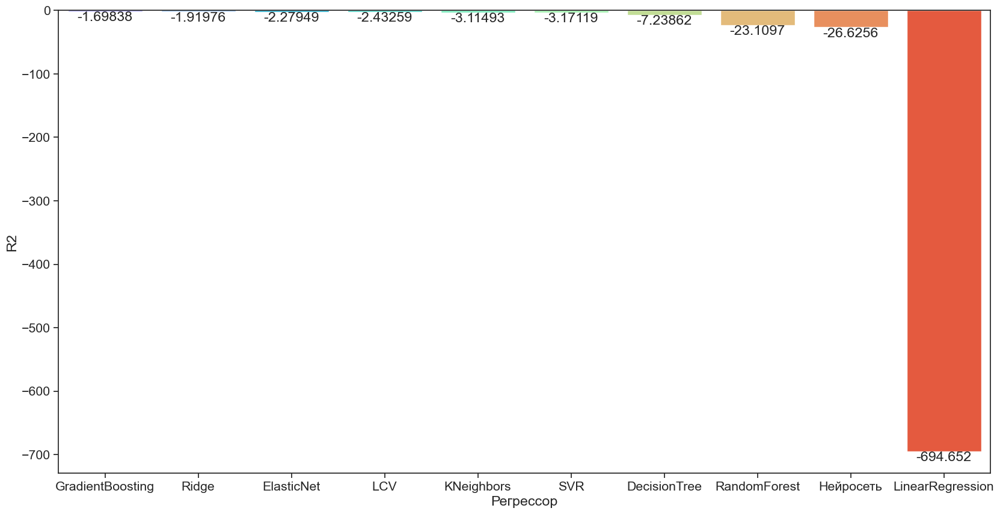

In [144]:
plt.figure(figsize = (20, 10))
ax = sns.barplot(data=df_r2_mn, x=df_r2_mn['Регрессор'], y=df_r2_mn['R2'], palette='rainbow', order=df_r2_mn.sort_values('R2',ascending = False).Регрессор)
for i in ax.containers:
    ax.bar_label(i,)

ни одна модель не справилась со своей задачей

создадим банку с нашей наименее худшей моделью

In [145]:
#с набором параметров для предсказания признака "Соотношение матрица-наполнитель"
best_model_mn = Pipeline([('preprocessing', MinMaxScaler()), ('regressor', GradientBoostingRegressor(loss='squared_error', max_depth=1, max_features=1, n_estimators=1))])
best_model_mn.fit(X_train_mn.values, y_train_mn.iloc[:, 0].values) #добавляем .values для сохранения модели

Pipeline(steps=[('preprocessing', MinMaxScaler()),
                ('regressor',
                 GradientBoostingRegressor(max_depth=1, max_features=1,
                                           n_estimators=1))])

In [146]:
#проверяем работоспособность модели
best_model_mn_before = best_model_mn.predict(X_test_mn)
best_model_mn_before[0]

0.4178629151182759

видим что модель предсказала некое значение, значит она работает

In [200]:
#тестируем формулу которая будет выдавать предсказание денормализованного вида, то есть не трансформированное значение предсказания
best_model_mn_before_out = best_model_mn_before * ((np.max(df_clean['Соотношение матрица-наполнитель'].values) - np.min(df_clean['Соотношение матрица-наполнитель'].values)) + np.min(df_clean['Соотношение матрица-наполнитель'].values))
best_model_mn_before_out[0]

2.046675502620123

In [147]:
#сохраняем модель предсказывающую признак "Соотношение матрица-наполнитель"
with open('data/flask_app/models/best_model_mn.pkl','wb') as outp:
    pickle.dump(best_model_mn, outp)

In [199]:
#создаём нормализатор входных значений и сохраняем его
scaler_in_mn = MinMaxScaler().fit(df_clean[df_clean.columns.drop('Соотношение матрица-наполнитель')].values)
with open('data/flask_app/models/scaler_in_mn.pkl','wb') as outp:
    pickle.dump(scaler_in_mn, outp)


In [198]:
#создаём денормализатор выходных значений, приводим их в собственный масштаб
scaler_out_mn = (np.max(df_clean['Соотношение матрица-наполнитель'].values) - np.min(df_clean['Соотношение матрица-наполнитель'].values)) + np.min(df_clean['Соотношение матрица-наполнитель'].values)
with open('data/flask_app/models/scaler_out_mn.pkl','wb') as outp:
    pickle.dump(scaler_out_mn, outp)

In [148]:
#загружаем модель и проверяем её работоспособность
with open('data/flask_app/models/best_model_mn.pkl', 'rb') as inp:
    best_model_mn = pickle.load(inp)
    
best_model_mn_after = best_model_mn.predict(X_test_mn)

#проверяем каждое старое прогнозное значение с новым. функция all возвращает true, если логическая маска
#целиком состоит из значений true. 
print((best_model_mn_before==best_model_mn_after).all())

True


теперь для нейросети

In [149]:
#сохраняем обученную модель
net_mn.save('data/flask_app/models/net_mn')

INFO:tensorflow:Assets written to: data/flask_app/models/net_mn\assets


загружаем сохранённую модель и проверяем ее работоспособность

In [150]:
loaded_net_mn = keras.models.load_model('data/flask_app/models/net_mn')
best_model_mn = net_mn.predict(X_test_mn)
best_model_loaded_mn = loaded_net_mn.predict(X_test_mn)
print((best_model_mn==best_model_loaded_mn).all())

1/1 [==============================] - 0s 48ms/step
True


загружаемая модель работает как и ожидалось, следовательно, она готова к реализации в приложении.

## **На данном этапе исследовательскую работу можно считать завершенной. По результатам исследования можно сделать вывод о том, что входной датасет практически не имеет реальных значений, пригодных для использования в нашей задаче. Но тем не менее, мы очистили его, и даже на таком маленьком датасете нам удалось выполнить поставленную задачу. Пусть даже модели и не пригодны для применения в реальных условиях, но задача выполнена.** 

### **На основании созданных и обученных моделей реализовано веб-приложение для предсказания трёх приведенных выше целевых признаков на выбор**